# Surprise Housing Case Study
<font color='#1D8348'> **This case study involves analyzing different factors impacting the house prices in the Austrailian market and building a regression model with regularization for the prediction of houseprice.** 

**Problem Statement**

**Surprise Housing** has decided to enter the Australian market, The company is looking at prospective properties to buy to enter the market. The general business model of the company is to buy the houses and lower prices and sell them at higher prices.

We are required to analyze the different features of the houses and build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.

The company wants to know:

 - Which variables are significant in predicting the price of a house, and
 - How well those variables describe the price of a house.

## Part 1: Reading and Pre-Processing the Data
 - Reading data
 - Checking and treatment of for missing values
 - Creation of derived variables or change in the form of any variables if required

In [1]:
# Importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
plt.style.use("ggplot")

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import Ridge, Lasso


from sklearn.metrics import r2_score, mean_squared_error

from scipy.stats import stats
from datetime import datetime

# Do not show warnings
import warnings
warnings.filterwarnings('ignore')

# Set display limits
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

In [2]:
# Importing the dataset
housing_data = pd.read_csv("train.csv")
housing_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
# Checking the overall data structure
housing_data.shape

(1460, 81)

In [4]:
# Checking the columns
housing_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [5]:
# Checking for missing values
percent_missing_pre = ((housing_data.isnull().sum() / housing_data.shape[0])*100).sort_values(ascending=False)
percent_missing_pre[percent_missing_pre>0]

PoolQC          99.520548
MiscFeature     96.301370
Alley           93.767123
Fence           80.753425
MasVnrType      59.726027
FireplaceQu     47.260274
LotFrontage     17.739726
GarageYrBlt      5.547945
GarageCond       5.547945
GarageType       5.547945
GarageFinish     5.547945
GarageQual       5.547945
BsmtFinType2     2.602740
BsmtExposure     2.602740
BsmtQual         2.534247
BsmtCond         2.534247
BsmtFinType1     2.534247
MasVnrArea       0.547945
Electrical       0.068493
dtype: float64

#### Observations:
- Some categorical variables have been stored as numeric, they need to reclassified
- The variables can be separated into the following 4 broad categories
    - Surrounding information
    - External characteristics of the house
    - Internal characteristics of the house
    - Utilities and Amenities provided
- Some categorical variables have large missing values. Upon investigation of the data dictionary we understand the reason for they being missing is because of the absenxe of those features and thus they can replaced by a value like "Feature not available" or something on the similar lines. 
- Some continuos variables with missing values would require imputation by the requisite central tendency like a mean or a median


In [6]:
# Replacing missing values with None as per the data dictionary
meaningful_null_columns = ["PoolQC", "MiscFeature", "Alley", "Fence", "FireplaceQu", "MasVnrType", "GarageCond", 
                           "GarageType", "GarageFinish", "GarageQual", "BsmtFinType2", "BsmtExposure", "BsmtQual", 
                           "BsmtCond", "BsmtFinType1"]
for column in meaningful_null_columns:
    housing_data[column].fillna("No " + column, inplace = True)

In [7]:
# Replacing the numeric columns with median and also the 1 missing observation for electrical with mode
housing_data['MasVnrArea'].fillna(housing_data['MasVnrArea'].median(),inplace=True)
housing_data['LotFrontage'].fillna(housing_data['LotFrontage'].median(),inplace=True)
housing_data['Electrical'].fillna("SBrkr",inplace=True)
housing_data['GarageYrBlt'].fillna(housing_data['GarageYrBlt'].median(),inplace=True) 

In [8]:
# Checking for missing values
percent_missing_post = ((housing_data.isnull().sum() / housing_data.shape[0])*100).sort_values(ascending=False)
percent_missing_post.sum()

0.0

In [9]:
# Converting the numeric columns to categorical
housing_data['MSSubClass'] = housing_data['MSSubClass'].astype('object')
housing_data['OverallQual'] = housing_data['OverallQual'].astype('object')
housing_data['OverallCond'] = housing_data['OverallCond'].astype('object')
housing_data['FullBath'] = housing_data['FullBath'].astype('object')
housing_data['HalfBath'] = housing_data['HalfBath'].astype('object')
housing_data['Fireplaces'] = housing_data['Fireplaces'].astype('object')
housing_data['GarageCars'] = housing_data['GarageCars'].astype('object')
housing_data['BedroomAbvGr'] = housing_data['BedroomAbvGr'].astype('object')
housing_data['KitchenAbvGr'] = housing_data['KitchenAbvGr'].astype('object')
housing_data['TotRmsAbvGrd'] = housing_data['TotRmsAbvGrd'].astype('object')
housing_data['BsmtFullBath'] = housing_data['BsmtFullBath'].astype('object')
housing_data['BsmtHalfBath'] = housing_data['BsmtHalfBath'].astype('object')
housing_data['MoSold'] = housing_data['MoSold'].astype('object')
housing_data['YrSold'] = housing_data['YrSold'].astype('object')

In [10]:
# Converting actual years columns to number of years 
Current_Year = int(datetime.now().strftime('%Y'))
housing_data['YearBuilt'] = Current_Year -  housing_data['YearBuilt']
housing_data['YearRemodAdd'] = Current_Year -  housing_data['YearRemodAdd']
housing_data['GarageYrBlt'] = Current_Year -  housing_data['GarageYrBlt']
# housing_data['YrSold'] = Current_Year -  housing_data['YrSold']

In [11]:
# Creating a function to create boxplot and histogram
def custom_boxplot_distplot(dataframe,x_col):
    '''
    creates boxplot and a histogram 
    
    Parameters:
    - dataframe: pandas DataFrame
    - x_col: str, name of the column for x-axis
        
    Returns:
    plots the barplot and histogram
    subplots used plotting grpahs side by side
    
    summary added with percentiles at the bottom
    '''
    plt.figure(figsize=(15,5))
    plt.subplot(1,2,1)
    sns.distplot(dataframe[x_col],rug=True,color='green')
    plt.subplot(1,2,2)
    sns.boxplot(data=dataframe,x=x_col,color='skyblue')
    plt.suptitle(x_col + ' Distribution',fontsize=15)
    plt.show()
    print(dataframe[x_col].describe(percentiles=[0.05,0.10,0.25,0.50,.75,.80,.85,.90,.95,.99]))

In [12]:
# Function to create barplots and subplots 

def custom_bar_plots(df, columns_to_plot):
    """
    Creates individual bar plots for specified columns in the given DataFrame.

    Args:
        df (pd.DataFrame): The input DataFrame.
        columns_to_plot (list): List of column names to plot.

    Returns:
        None
    """
    fig, axes = plt.subplots(len(columns_to_plot), 1, figsize = (18,6*len(columns_to_plot)))
    
    for i, col in enumerate (columns_to_plot):
        
        value_counts_df = df[col].value_counts(normalize=True).reset_index()
        value_counts_df.columns = ['unique_values', 'counts']
    
        value_counts_df.counts = round(value_counts_df.counts*100,1)
    
        sns.barplot(data = value_counts_df, x='unique_values', y='counts', 
                    order=value_counts_df.sort_values('counts',ascending=False).unique_values,
                    ax=axes[i])
        
        for p in axes[i].patches:
            axes[i].annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                             ha='center', va='bottom', fontsize=12, color='black')
            
        axes[i].set_xlabel('Unique Values', fontsize=12)
        axes[i].set_ylabel('Counts', fontsize=12)
        axes[i].set_title(f'{col} Distribution', fontsize=16)
        
    plt.tight_layout()
    plt.show()

In [13]:
def plot_categorical_boxplots(data, cat_vars):
    """
    Plots boxplots for specified categorical variables against the 'SalePrice' column.

    Args:
        data (pd.DataFrame): The dataset containing the relevant columns.
        cat_vars (list): List of categorical variable names.

    Returns:
        None
    """
    plt.figure(figsize=(24, 24))
    for i, cat_var in enumerate(cat_vars):
        my_order = data[[cat_var, 'SalePrice']].groupby(by=cat_var).median().reset_index()
        my_order = my_order.sort_values(by='SalePrice', ascending=False)
        order_list = list(my_order[cat_var])
        plt.subplot(int(len(cat_vars)/2), 2, i+1)
        sns.boxplot(data=data, x=cat_var, y='SalePrice', order=order_list)

    plt.show()

## Part 2: Exploratory Data Analysis (EDA)
 - Perform univariate and bi-variate analysis

### Univariate Analysis

#### Analyzing the Target Variable

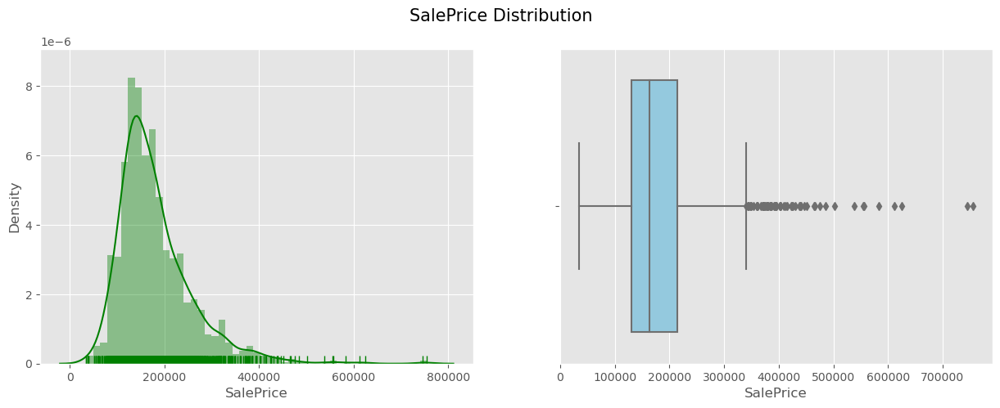

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
5%        88000.000000
10%      106475.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
80%      230000.000000
85%      250000.000000
90%      278000.000000
95%      326100.000000
99%      442567.010000
max      755000.000000
Name: SalePrice, dtype: float64


In [14]:
# SalePrice Distribution
custom_boxplot_distplot(housing_data,x_col='SalePrice')

- The **SalePrice** variable seems to have a slightly right skewed distribution. Hence we will apply a log transformation for making the distribution normal 

In [15]:
# Log Transformation of the SalePrice variable
housing_data['SalePrice'] = np.log(housing_data['SalePrice'])

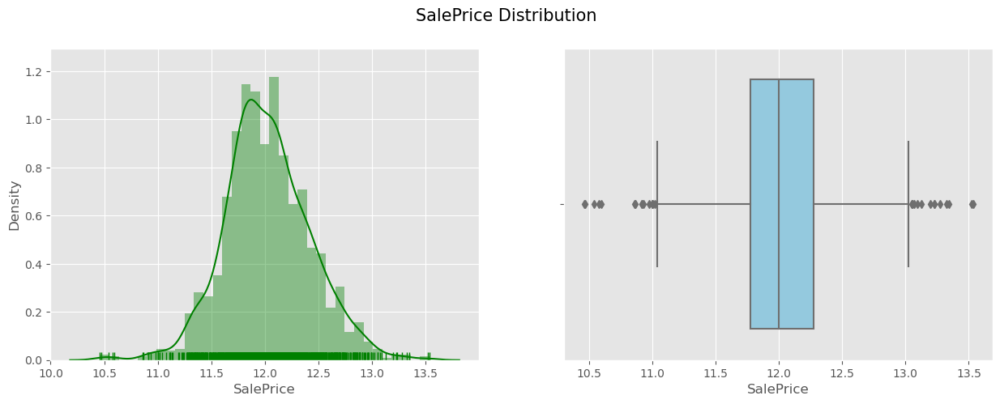

count    1460.000000
mean       12.024051
std         0.399452
min        10.460242
5%         11.385092
10%        11.575665
25%        11.775097
50%        12.001505
75%        12.273731
80%        12.345835
85%        12.429216
90%        12.535376
95%        12.694958
99%        13.000323
max        13.534473
Name: SalePrice, dtype: float64


In [16]:
# Distribution of Log of SalePrice
custom_boxplot_distplot(housing_data,x_col='SalePrice')

- The log tranformation seems to have taken care of the skewness

#### Analyzing all numeric variables

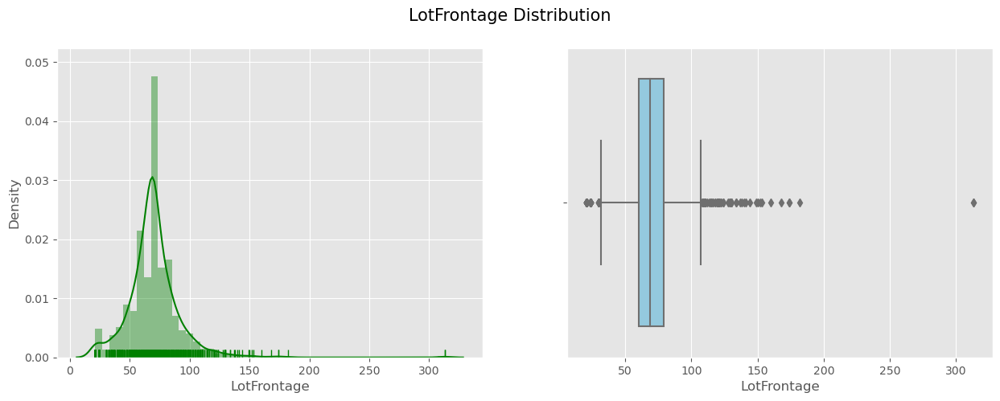

count    1460.000000
mean       69.863699
std        22.027677
min        21.000000
5%         35.950000
10%        49.000000
25%        60.000000
50%        69.000000
75%        79.000000
80%        80.000000
85%        85.000000
90%        92.000000
95%       104.000000
99%       137.410000
max       313.000000
Name: LotFrontage, dtype: float64


In [17]:
# LotFrontage Distribution
custom_boxplot_distplot(housing_data,x_col='LotFrontage')

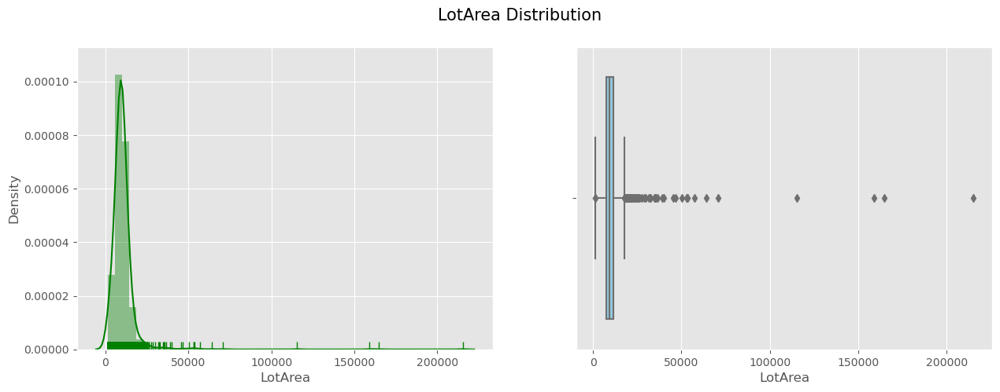

count      1460.000000
mean      10516.828082
std        9981.264932
min        1300.000000
5%         3311.700000
10%        5000.000000
25%        7553.500000
50%        9478.500000
75%       11601.500000
80%       12205.800000
85%       13161.100000
90%       14381.700000
95%       17401.150000
99%       37567.640000
max      215245.000000
Name: LotArea, dtype: float64


In [18]:
# LotArea Distribution
custom_boxplot_distplot(housing_data,x_col='LotArea')

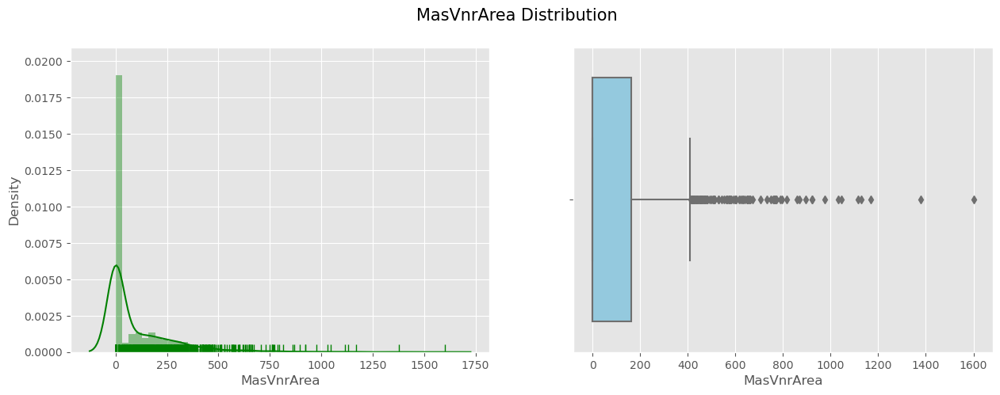

count    1460.000000
mean      103.117123
std       180.731373
min         0.000000
5%          0.000000
10%         0.000000
25%         0.000000
50%         0.000000
75%       164.250000
80%       205.200000
85%       261.150000
90%       335.000000
95%       456.000000
99%       791.280000
max      1600.000000
Name: MasVnrArea, dtype: float64


In [19]:
# MasVnrArea Distribution
custom_boxplot_distplot(housing_data,x_col='MasVnrArea')

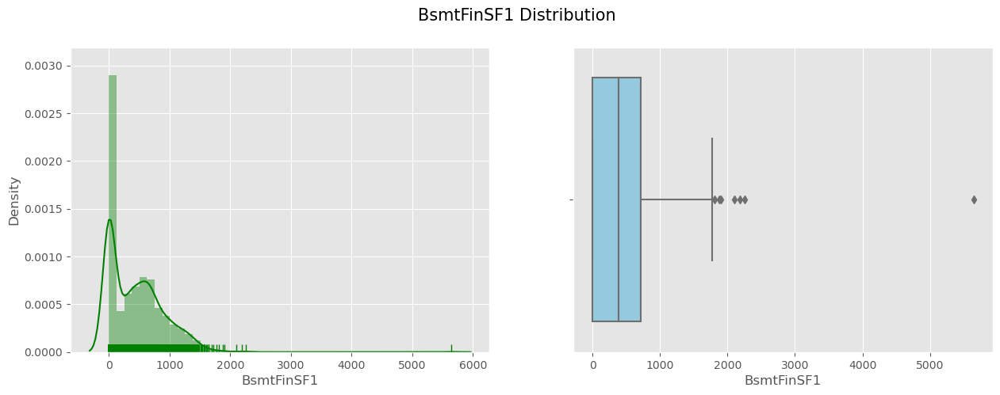

count    1460.000000
mean      443.639726
std       456.098091
min         0.000000
5%          0.000000
10%         0.000000
25%         0.000000
50%       383.500000
75%       712.250000
80%       806.400000
85%       929.450000
90%      1065.500000
95%      1274.000000
99%      1572.410000
max      5644.000000
Name: BsmtFinSF1, dtype: float64


In [20]:
# BsmtFinSF1 Distribution
custom_boxplot_distplot(housing_data,x_col='BsmtFinSF1')

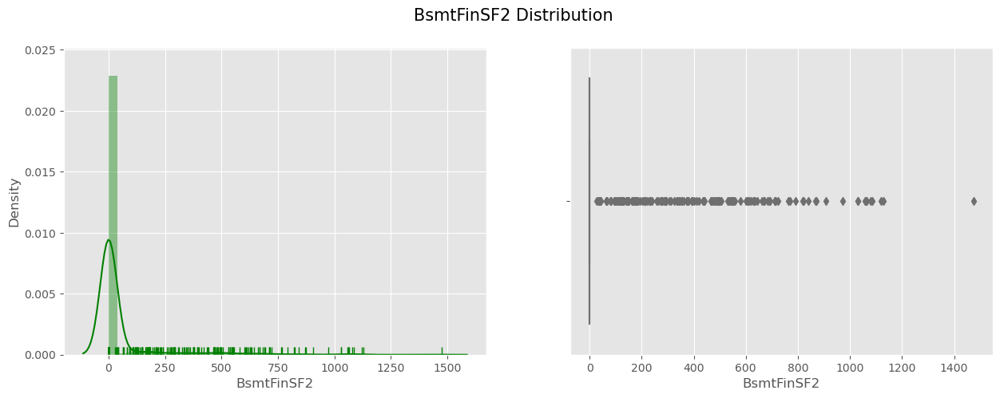

count    1460.000000
mean       46.549315
std       161.319273
min         0.000000
5%          0.000000
10%         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
80%         0.000000
85%         0.000000
90%       117.200000
95%       396.200000
99%       830.380000
max      1474.000000
Name: BsmtFinSF2, dtype: float64


In [21]:
# BsmtFinSF2 Distribution
custom_boxplot_distplot(housing_data,x_col='BsmtFinSF2')

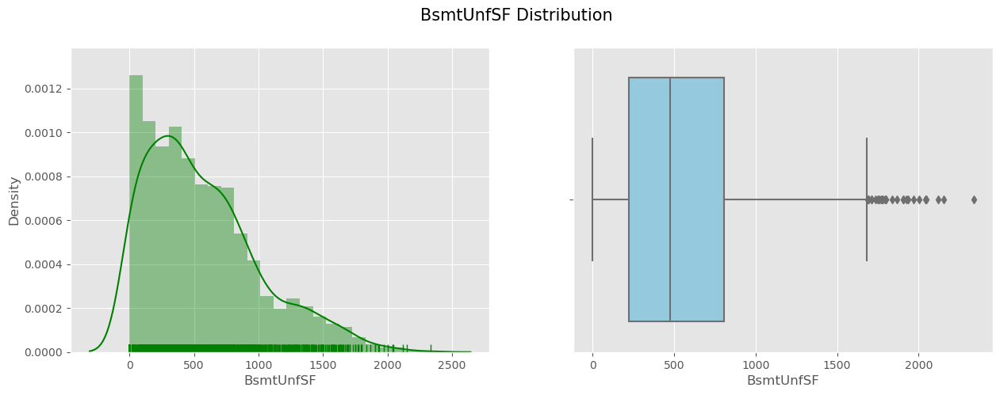

count    1460.000000
mean      567.240411
std       441.866955
min         0.000000
5%          0.000000
10%        74.900000
25%       223.000000
50%       477.500000
75%       808.000000
80%       896.000000
85%      1010.300000
90%      1232.000000
95%      1468.000000
99%      1797.050000
max      2336.000000
Name: BsmtUnfSF, dtype: float64


In [22]:
# BsmtUnfSF Distribution
custom_boxplot_distplot(housing_data,x_col='BsmtUnfSF')

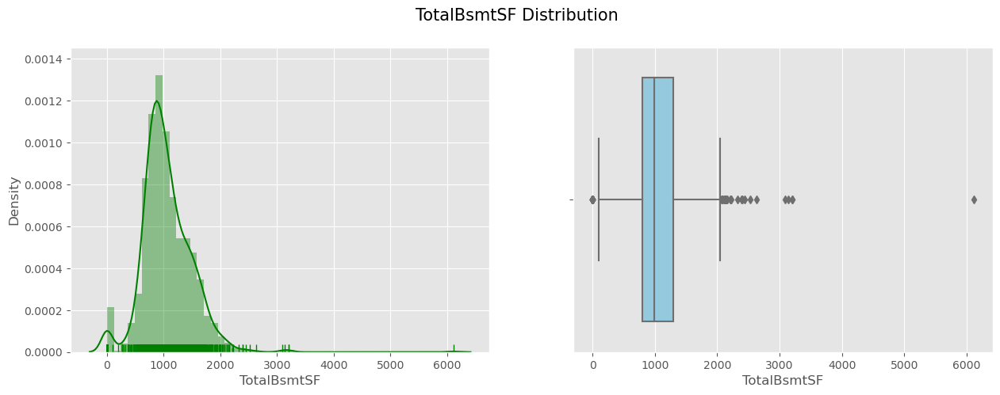

count    1460.000000
mean     1057.429452
std       438.705324
min         0.000000
5%        519.300000
10%       636.900000
25%       795.750000
50%       991.500000
75%      1298.250000
80%      1391.200000
85%      1485.150000
90%      1602.200000
95%      1753.000000
99%      2155.050000
max      6110.000000
Name: TotalBsmtSF, dtype: float64


In [23]:
# TotalBsmtSF Distribution
custom_boxplot_distplot(housing_data,x_col='TotalBsmtSF')

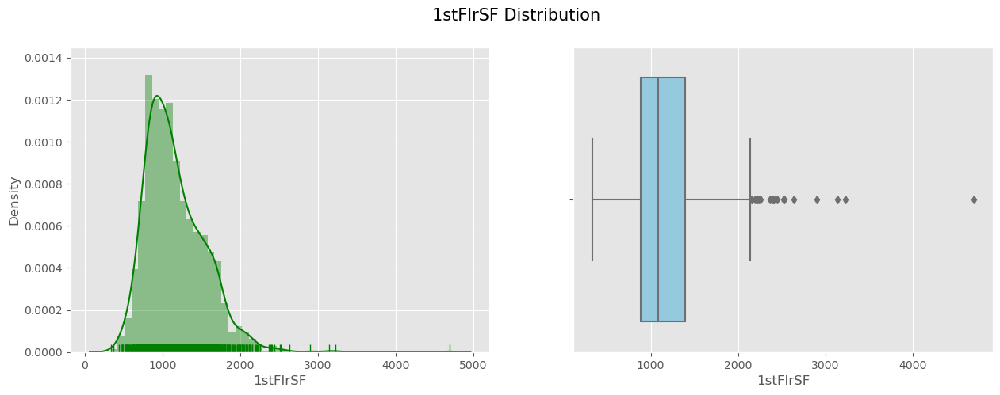

count    1460.000000
mean     1162.626712
std       386.587738
min       334.000000
5%        672.950000
10%       756.900000
25%       882.000000
50%      1087.000000
75%      1391.250000
80%      1482.400000
85%      1572.150000
90%      1680.000000
95%      1831.250000
99%      2219.460000
max      4692.000000
Name: 1stFlrSF, dtype: float64


In [24]:
# 1stFlrSF Distribution
custom_boxplot_distplot(housing_data,x_col='1stFlrSF')

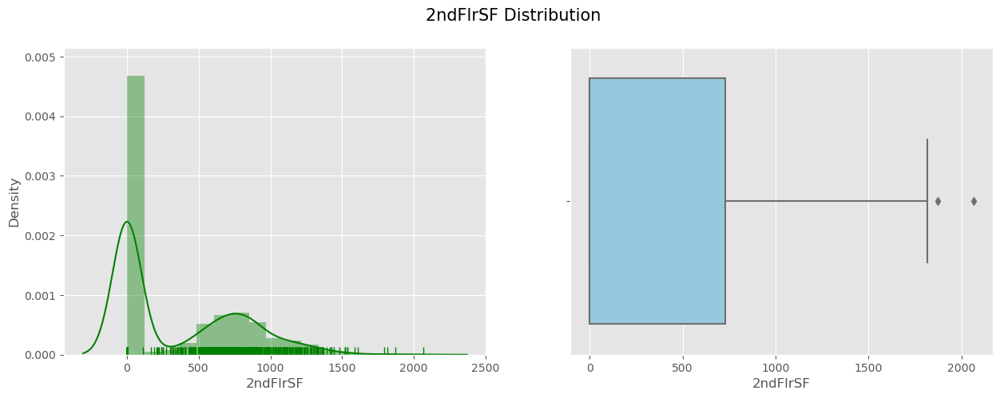

count    1460.000000
mean      346.992466
std       436.528436
min         0.000000
5%          0.000000
10%         0.000000
25%         0.000000
50%         0.000000
75%       728.000000
80%       796.200000
85%       870.150000
90%       954.200000
95%      1141.050000
99%      1418.920000
max      2065.000000
Name: 2ndFlrSF, dtype: float64


In [25]:
# 2ndFlrSF Distribution
custom_boxplot_distplot(housing_data,x_col='2ndFlrSF')

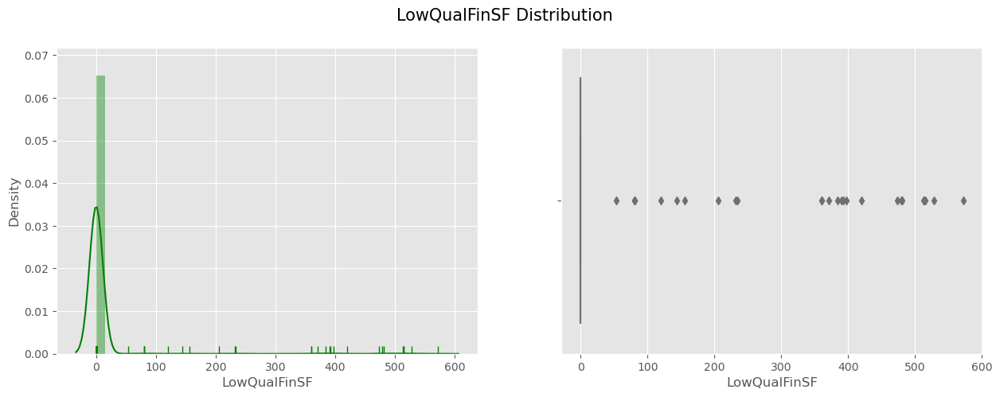

count    1460.000000
mean        5.844521
std        48.623081
min         0.000000
5%          0.000000
10%         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
80%         0.000000
85%         0.000000
90%         0.000000
95%         0.000000
99%       360.000000
max       572.000000
Name: LowQualFinSF, dtype: float64


In [26]:
# LowQualFinSF Distribution
custom_boxplot_distplot(housing_data,x_col='LowQualFinSF')

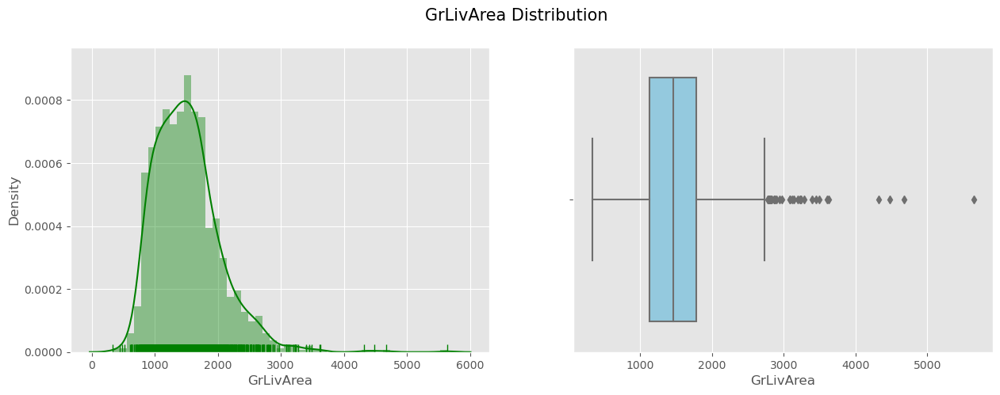

count    1460.000000
mean     1515.463699
std       525.480383
min       334.000000
5%        848.000000
10%       912.000000
25%      1129.500000
50%      1464.000000
75%      1776.750000
80%      1869.000000
85%      1987.300000
90%      2158.300000
95%      2466.100000
99%      3123.480000
max      5642.000000
Name: GrLivArea, dtype: float64


In [27]:
# GrLivArea Distribution
custom_boxplot_distplot(housing_data,x_col='GrLivArea')

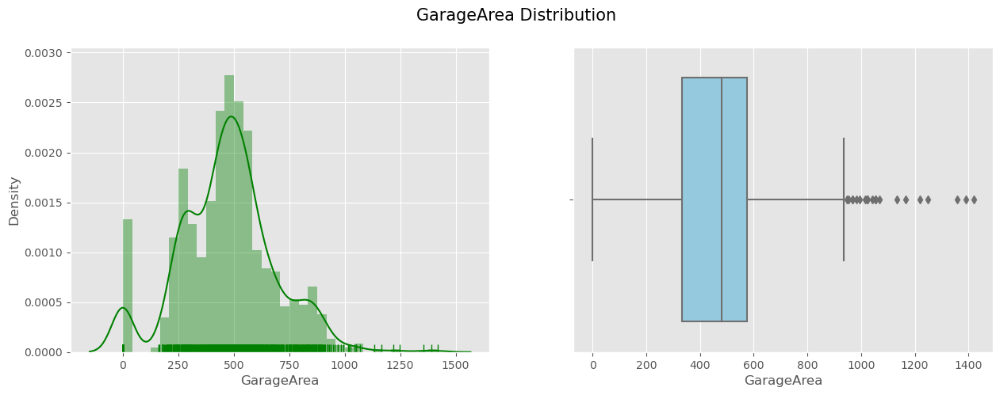

count    1460.000000
mean      472.980137
std       213.804841
min         0.000000
5%          0.000000
10%       240.000000
25%       334.500000
50%       480.000000
75%       576.000000
80%       620.200000
85%       672.000000
90%       757.100000
95%       850.100000
99%      1002.790000
max      1418.000000
Name: GarageArea, dtype: float64


In [28]:
# GarageArea Distribution
custom_boxplot_distplot(housing_data,x_col='GarageArea')

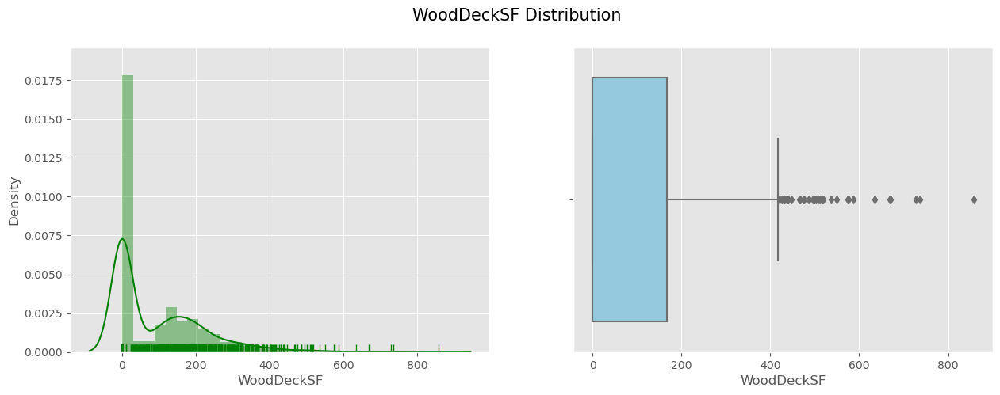

count    1460.000000
mean       94.244521
std       125.338794
min         0.000000
5%          0.000000
10%         0.000000
25%         0.000000
50%         0.000000
75%       168.000000
80%       192.000000
85%       216.000000
90%       262.000000
95%       335.000000
99%       505.460000
max       857.000000
Name: WoodDeckSF, dtype: float64


In [29]:
# WoodDeckSF Distribution
custom_boxplot_distplot(housing_data,x_col='WoodDeckSF')

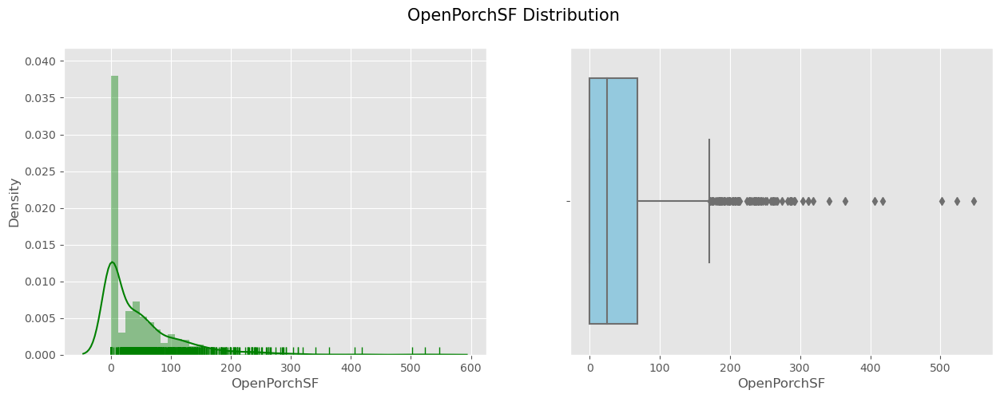

count    1460.000000
mean       46.660274
std        66.256028
min         0.000000
5%          0.000000
10%         0.000000
25%         0.000000
50%        25.000000
75%        68.000000
80%        83.200000
85%       105.000000
90%       130.000000
95%       175.050000
99%       285.820000
max       547.000000
Name: OpenPorchSF, dtype: float64


In [30]:
# OpenPorchSF Distribution
custom_boxplot_distplot(housing_data,x_col='OpenPorchSF')

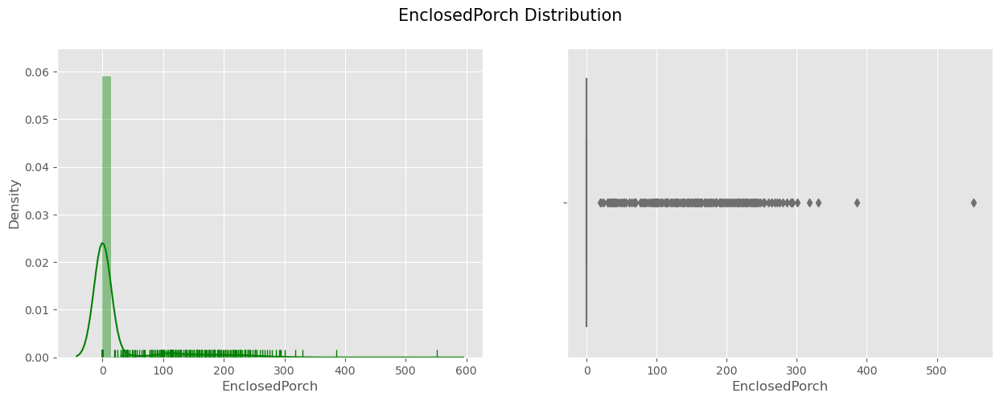

count    1460.000000
mean       21.954110
std        61.119149
min         0.000000
5%          0.000000
10%         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
80%         0.000000
85%         0.000000
90%       112.000000
95%       180.150000
99%       261.050000
max       552.000000
Name: EnclosedPorch, dtype: float64


In [31]:
# EnclosedPorch Distribution
custom_boxplot_distplot(housing_data,x_col='EnclosedPorch')

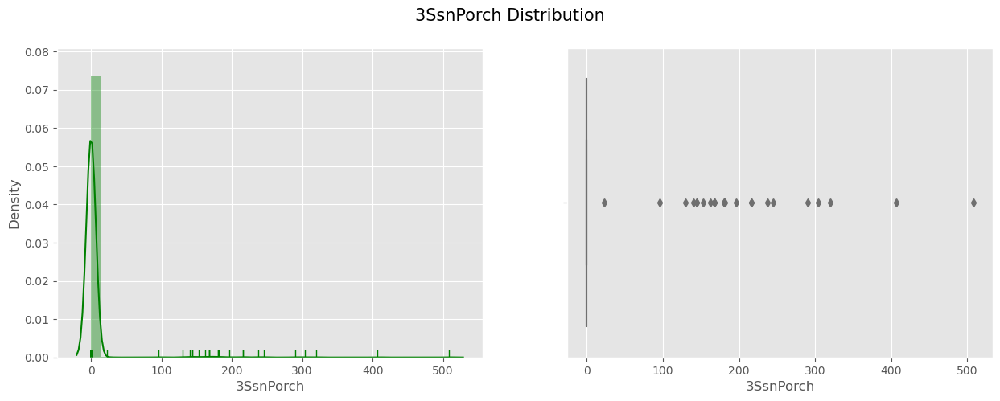

count    1460.000000
mean        3.409589
std        29.317331
min         0.000000
5%          0.000000
10%         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
80%         0.000000
85%         0.000000
90%         0.000000
95%         0.000000
99%       168.000000
max       508.000000
Name: 3SsnPorch, dtype: float64


In [32]:
# 3SsnPorch Distribution
custom_boxplot_distplot(housing_data,x_col='3SsnPorch')

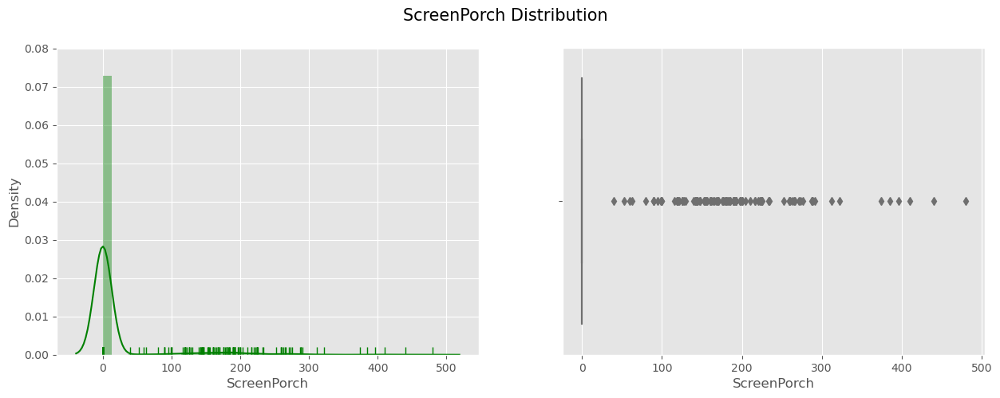

count    1460.000000
mean       15.060959
std        55.757415
min         0.000000
5%          0.000000
10%         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
80%         0.000000
85%         0.000000
90%         0.000000
95%       160.000000
99%       268.050000
max       480.000000
Name: ScreenPorch, dtype: float64


In [33]:
# ScreenPorch Distribution
custom_boxplot_distplot(housing_data,x_col='ScreenPorch')

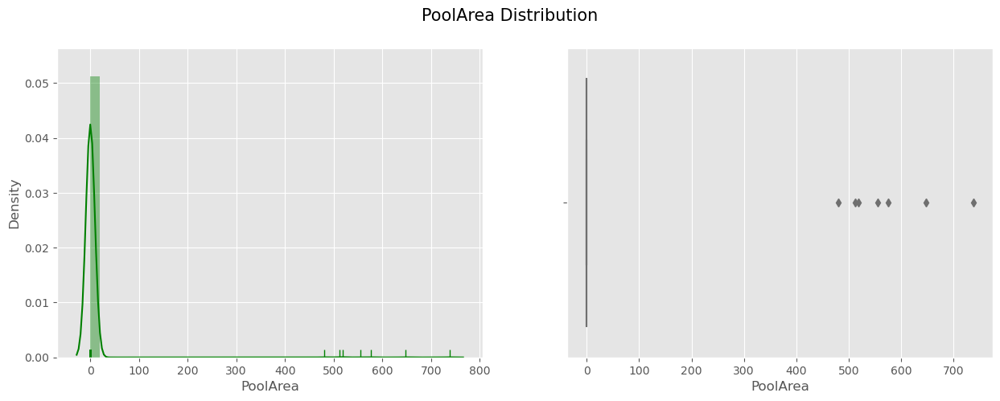

count    1460.000000
mean        2.758904
std        40.177307
min         0.000000
5%          0.000000
10%         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
80%         0.000000
85%         0.000000
90%         0.000000
95%         0.000000
99%         0.000000
max       738.000000
Name: PoolArea, dtype: float64


In [34]:
# PoolArea Distribution
custom_boxplot_distplot(housing_data,x_col='PoolArea')

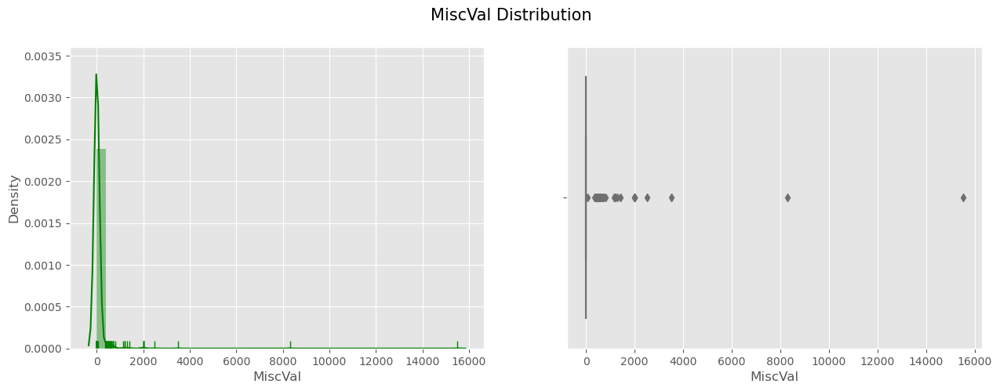

count     1460.000000
mean        43.489041
std        496.123024
min          0.000000
5%           0.000000
10%          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
85%          0.000000
90%          0.000000
95%          0.000000
99%        700.000000
max      15500.000000
Name: MiscVal, dtype: float64


In [35]:
# MiscVal Distribution
custom_boxplot_distplot(housing_data,x_col='MiscVal')

##### General Observations
 - There are columns like **BsmtFinSF2, LowQualFinSF, EnclosedPorch, 3SsnPorch, ScreenPorch, PoolArea, MiscVal** which have more than 90% of the values to be same and to be **0**. We can look to drop these columns as they might not add a lot of value to the overall analysis and the regression model.
 - Most of the variables also seem to have outliers but since we are using regularization we might not need to do any outlier treatment

##### Observations based on numeric columns univariate analysis
 - ~90% of the houses are below **278k AUD**
 - Almost all the houses have less than **130 feet** of connected street
 - median size of the property is **~9500 sqft**
 - ~50% of the houses have less than **380 sqft** of finished basement. In fact most of the houses have unfinished basement.
 - ~50% of the houses have
     - no second floor
     - less than **500 sqft** of garage area
     - no wodden deck
 - ~95% of the houses have good finishing
 - most of the houses (~85%) do not have closed or a 3 season or a screen porch. we can safely say that most of the houses having a porch have an open porch
 - 99% of the houses have **no pool**

##### In order to better analyze the categorical variables we have devided them into high level categories based upon the aspect of house features identified above

In [36]:
# List of surrounding area characteristics
area_char = ['MSSubClass', 'MSZoning', 'LandContour', 'Street', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2']

In [37]:
# List of external characteristics of the house excluding basement
house_char_ext = ['LotShape', 'LotConfig', 'BldgType', 'HouseStyle','OverallQual', 'OverallCond', 'RoofStyle', 'RoofMatl', 
                  'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation']

In [38]:
# List of internal characteristics of the house excluding basement
house_char_int = ['FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 
                  'Fireplaces', 'FireplaceQu']

In [39]:
# List of the utilities
util_char = ['Utilities', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical']

In [40]:
# List of basement characteristics
bsmt_char = ['BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'BsmtFullBath', 'BsmtHalfBath']

In [41]:
# List of Garage characteristics
garage_char = ['GarageType', 'GarageFinish', 'GarageCars', 'GarageQual', 'GarageCond', 'PavedDrive']

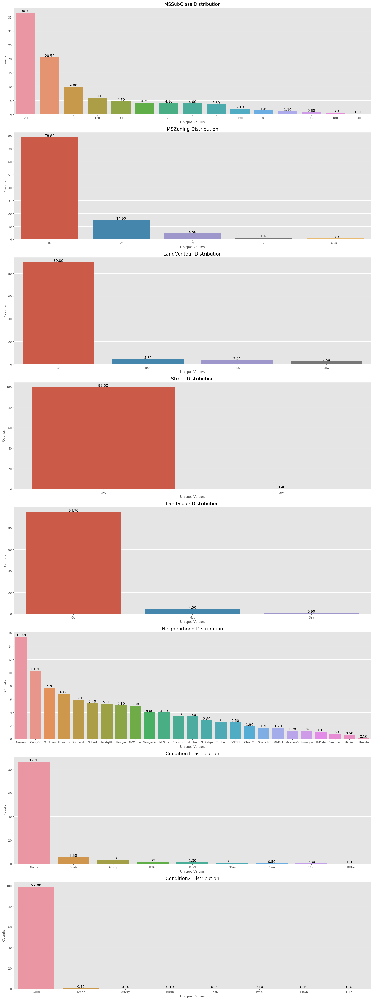

In [42]:
custom_bar_plots(housing_data, area_char)

 #### Surrounding Characteristics
 - ~67% of the houses are between 1-2 storey 
 - Half of the houses are built post 1946 
 - ~78% of the houses are in low residential density area
 - More than 90% of the houses have a flat landscape with a gentle slope and paved street

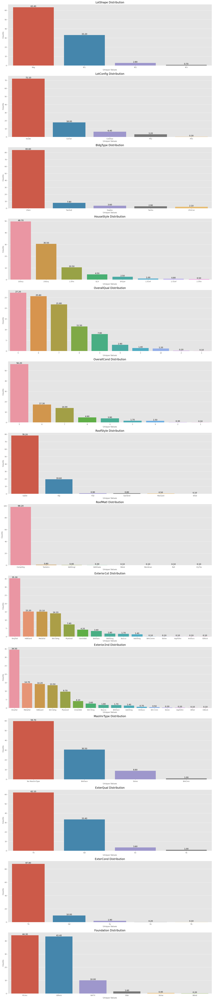

In [43]:
custom_bar_plots(housing_data, house_char_ext)

#### External Characteristics of the house
 - Most of the houses are
     - Regular shaped (~63%)
     - inside lot (~70%)
     - single family detached (more than 80%)
     - 1 strorey (~50%)
     - having gable roofs with a standard composite shingle (~80%)
     - with current external condition which can be termed as avergae/typical
     - with a poured concrete or cinder block foundation (~85%) 
     - average rating on overall finish with almost same number have above average rating (~27%)
     - average rating on current condition (~56%) 

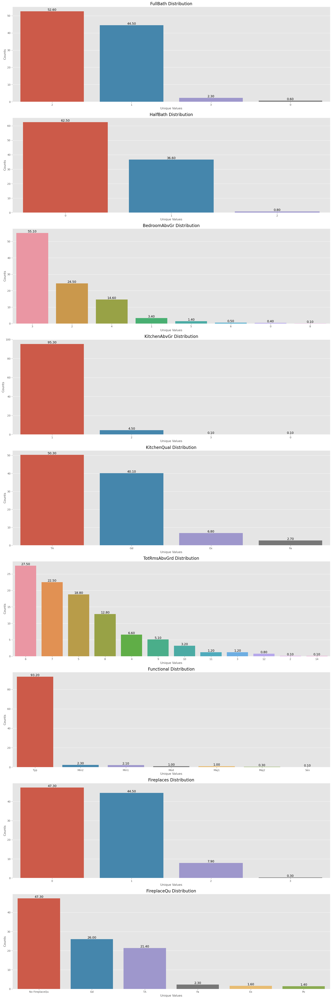

In [44]:
custom_bar_plots(housing_data, house_char_int)

#### Internal Characteristics of the house
- Most of the houses have:
    - 2 full bathrooms (~52%)
    - no half bathrooms (~62%)
    - 3 bedrooms above ground (assuming that grade means ground)
    - 1 kitchen (95%) termed to be having good to average quality
    - 4 or more rooms (~85%)
    - typical functionality (~90%)
    - 0 to 1 fireplace (~84%)

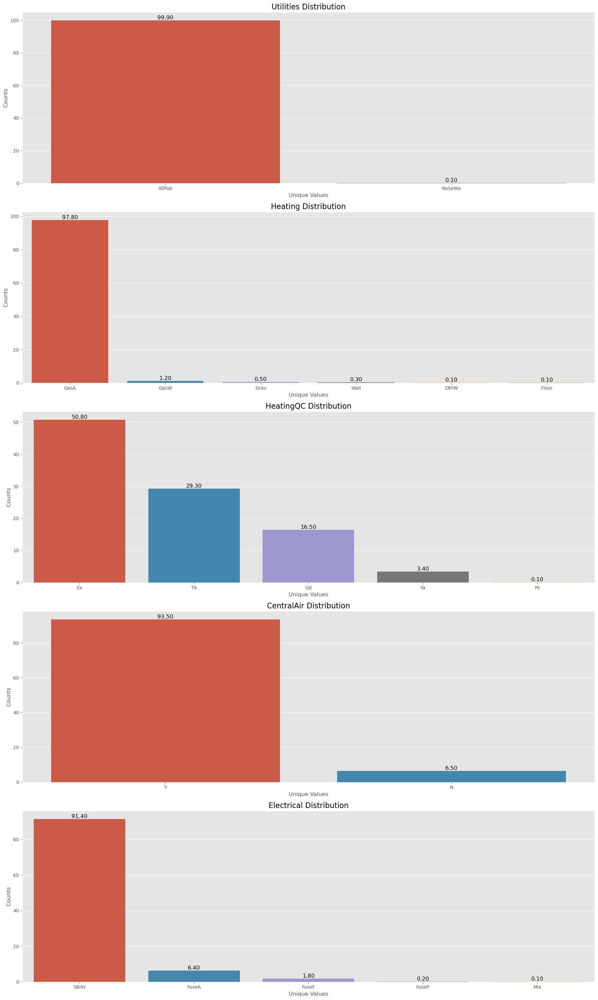

In [45]:
custom_bar_plots(housing_data, util_char)

#### Utilities Characteristics
 - Almost all of the houses have all public facilities
 - with central air condition
 - ~50% of have excellent heating quality

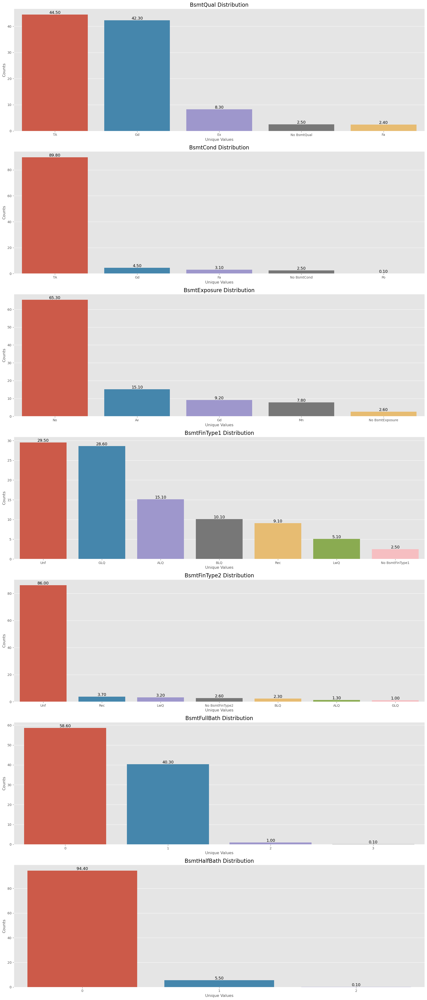

In [46]:
custom_bar_plots(housing_data, bsmt_char)

#### Basement Characteristics
 - ~80% basement have more than 90 inches height
 - ~90% have excellent quality of basement
 - ~65% with no exposure
 - with no bathrooms and unfinished

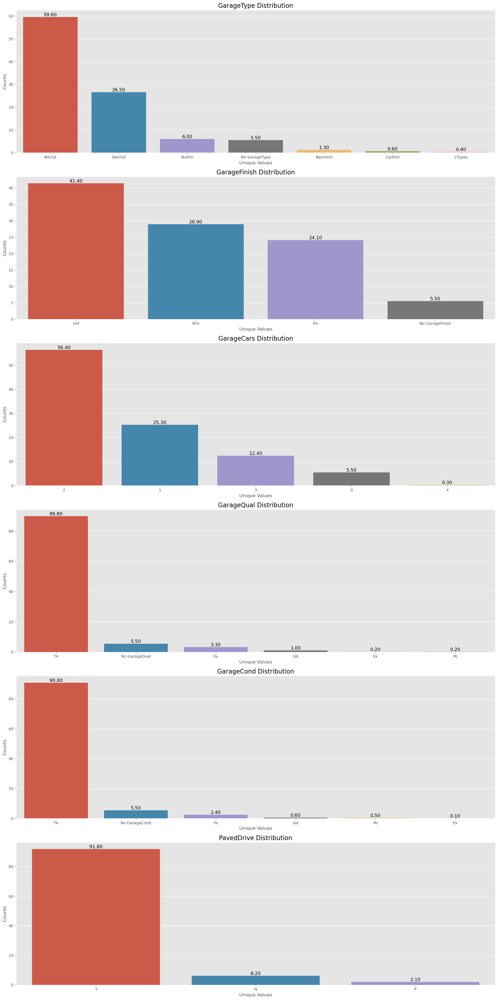

In [47]:
custom_bar_plots(housing_data, garage_char)

#### Basement Characteristics
 - Most of the houses have:
     - attached garages (~60%)
     - unfinished
     - 2 cars space (~55%)
     - average to good quality
     - paved driveway (~91%)

### Bi-Variate Analysis

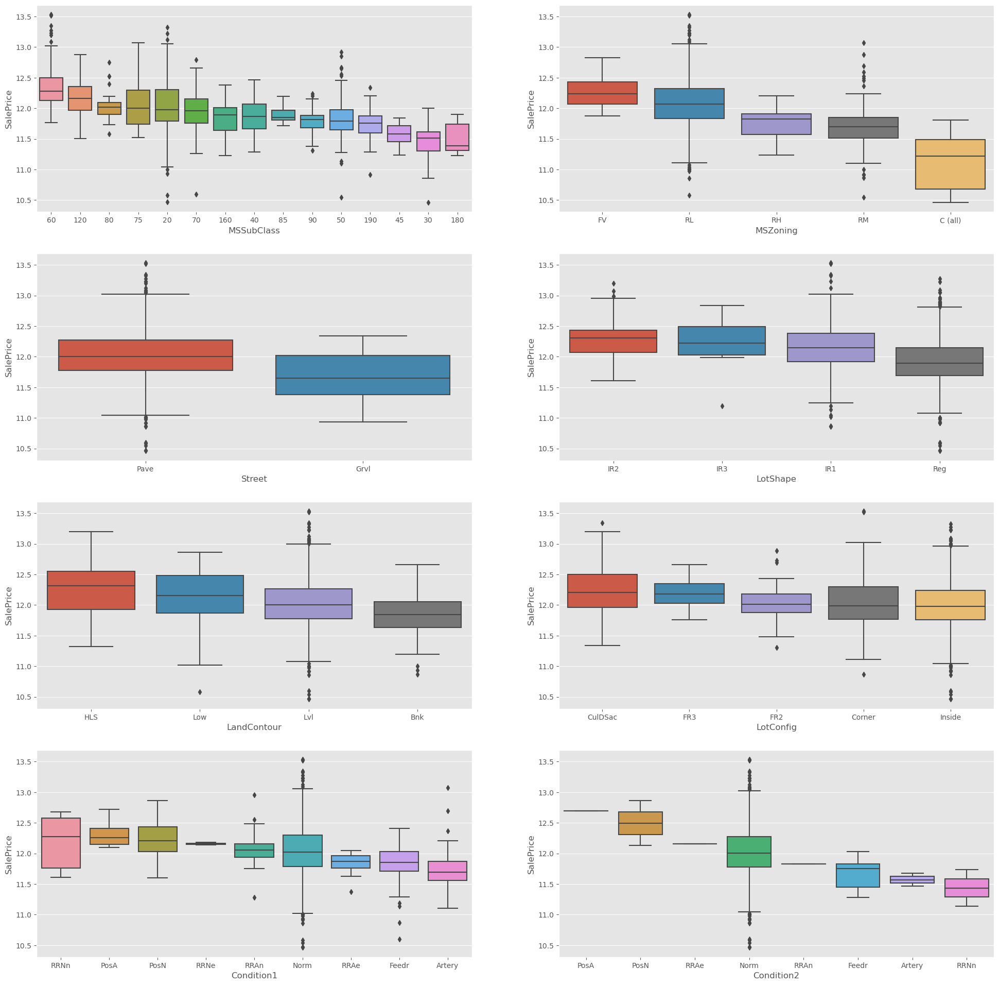

In [48]:
vars_cat_1 = ['MSSubClass', 'MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'Condition1', 'Condition2']
plot_categorical_boxplots(housing_data, vars_cat_1)

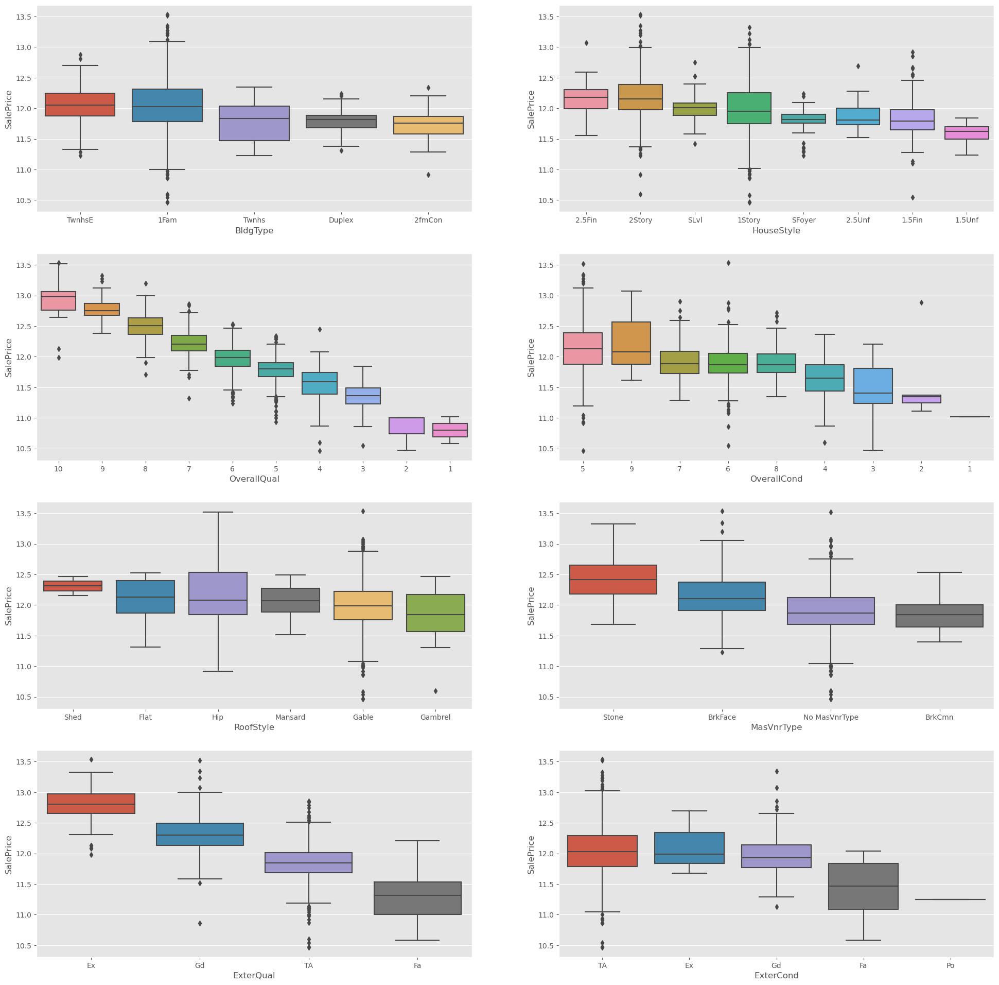

In [49]:
vars_cat_2 = ['BldgType', 'HouseStyle','OverallQual', 'OverallCond', 'RoofStyle', 'MasVnrType', 'ExterQual', 'ExterCond']
plot_categorical_boxplots(housing_data, vars_cat_2)

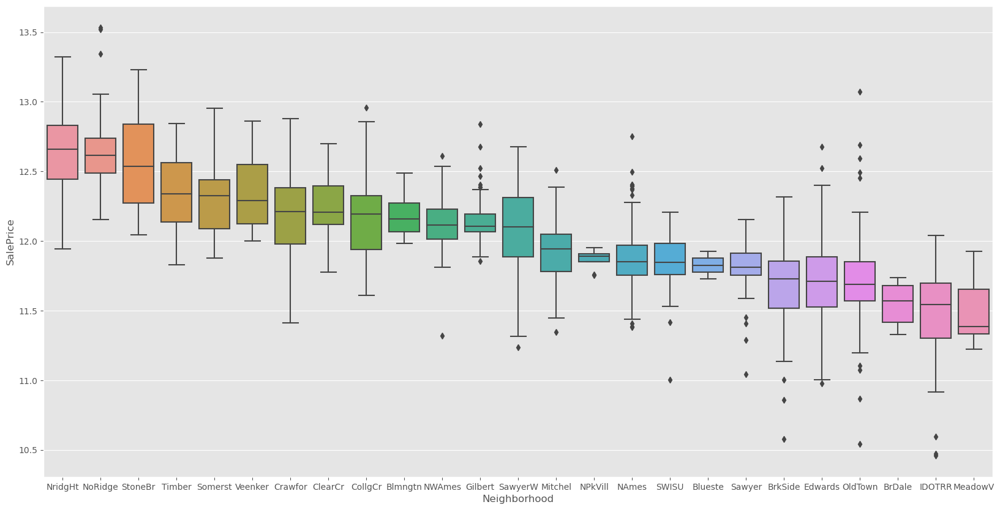

In [50]:
vars_cat_3 = ['Neighborhood']
plt.figure(figsize=(20, 10))
for i, cat_var in enumerate(vars_cat_3):
    my_order = housing_data[[cat_var, 'SalePrice']].groupby(by=cat_var).median().reset_index()
    my_order = my_order.sort_values(by='SalePrice', ascending=False)
    order_list = list(my_order[cat_var])
    sns.boxplot(data=housing_data, x=cat_var, y='SalePrice', order=order_list)

plt.show()

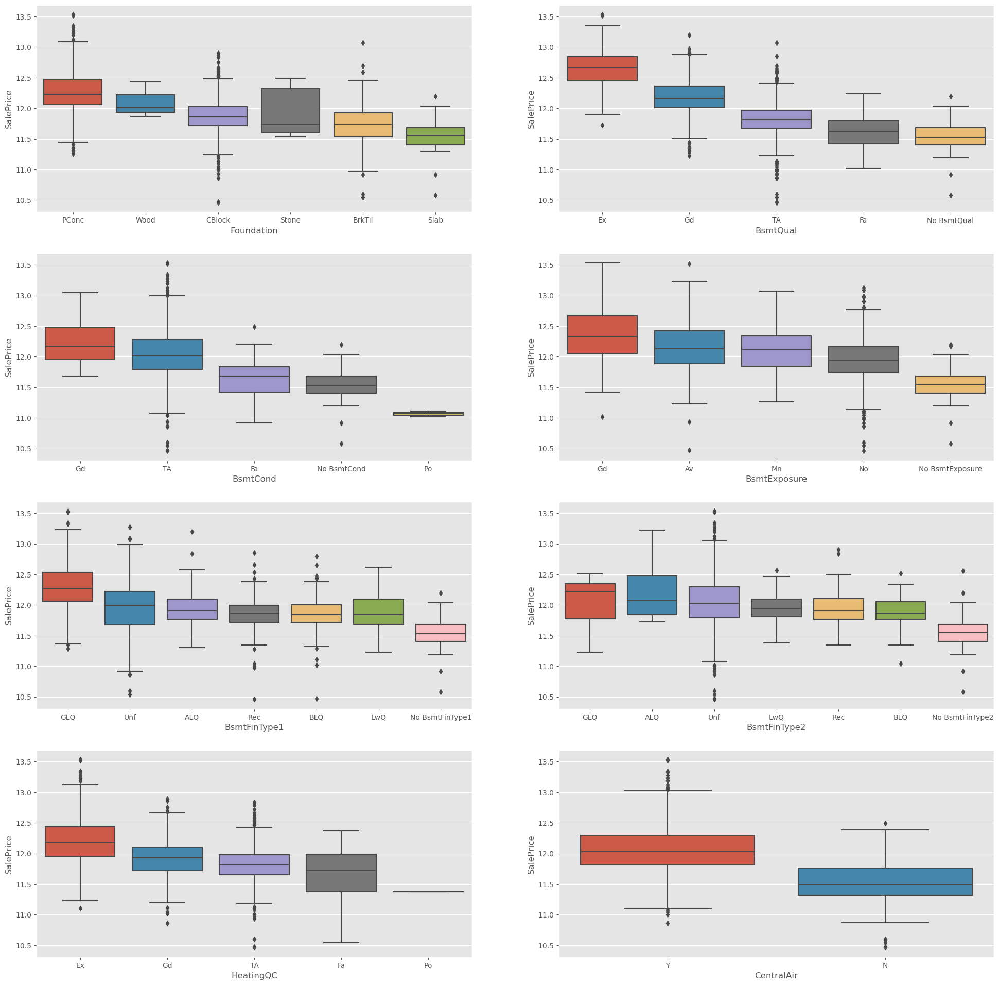

In [51]:
vars_cat_4 = ['Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 
            'CentralAir']
plot_categorical_boxplots(housing_data, vars_cat_4)

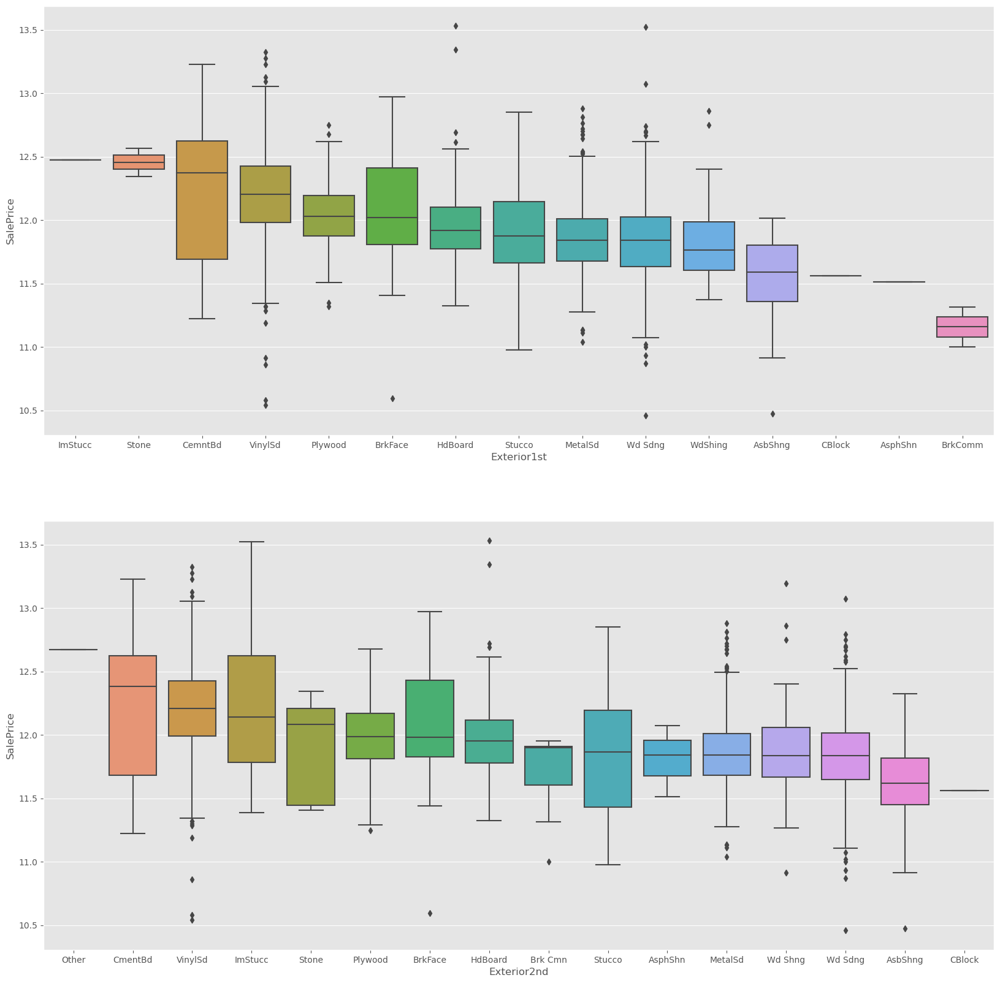

In [52]:
vars_cat_5 = ['Exterior1st','Exterior2nd']
plt.figure(figsize=(20, 20))
for i, cat_var in enumerate(vars_cat_5):
    my_order = housing_data[[cat_var, 'SalePrice']].groupby(by=cat_var).median().reset_index()
    my_order = my_order.sort_values(by='SalePrice', ascending=False)
    order_list = list(my_order[cat_var])
    plt.subplot(2, 1, i+1)
    sns.boxplot(data=housing_data, x=cat_var, y='SalePrice', order=order_list)

plt.show()

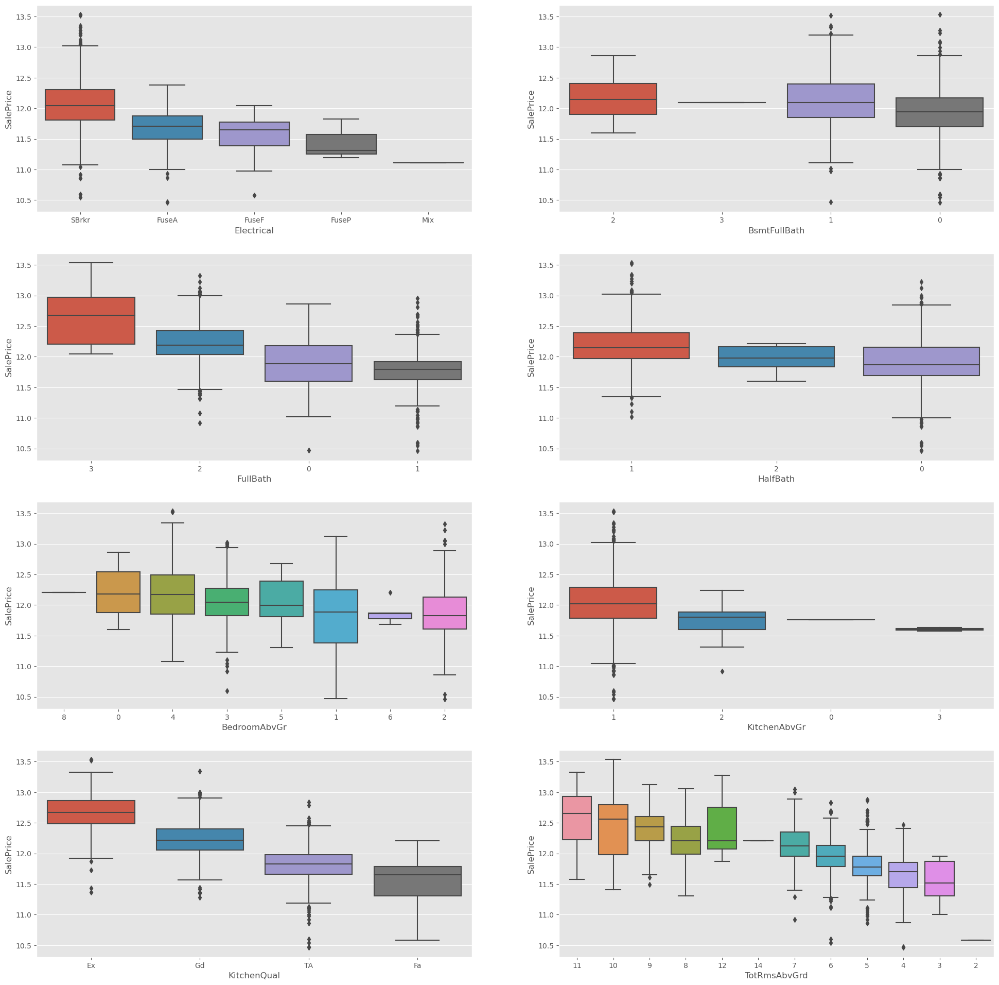

In [53]:
vars_cat_6 = ['Electrical', 'BsmtFullBath', 'FullBath', 'HalfBath','BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 
            'TotRmsAbvGrd']
plot_categorical_boxplots(housing_data, vars_cat_6)

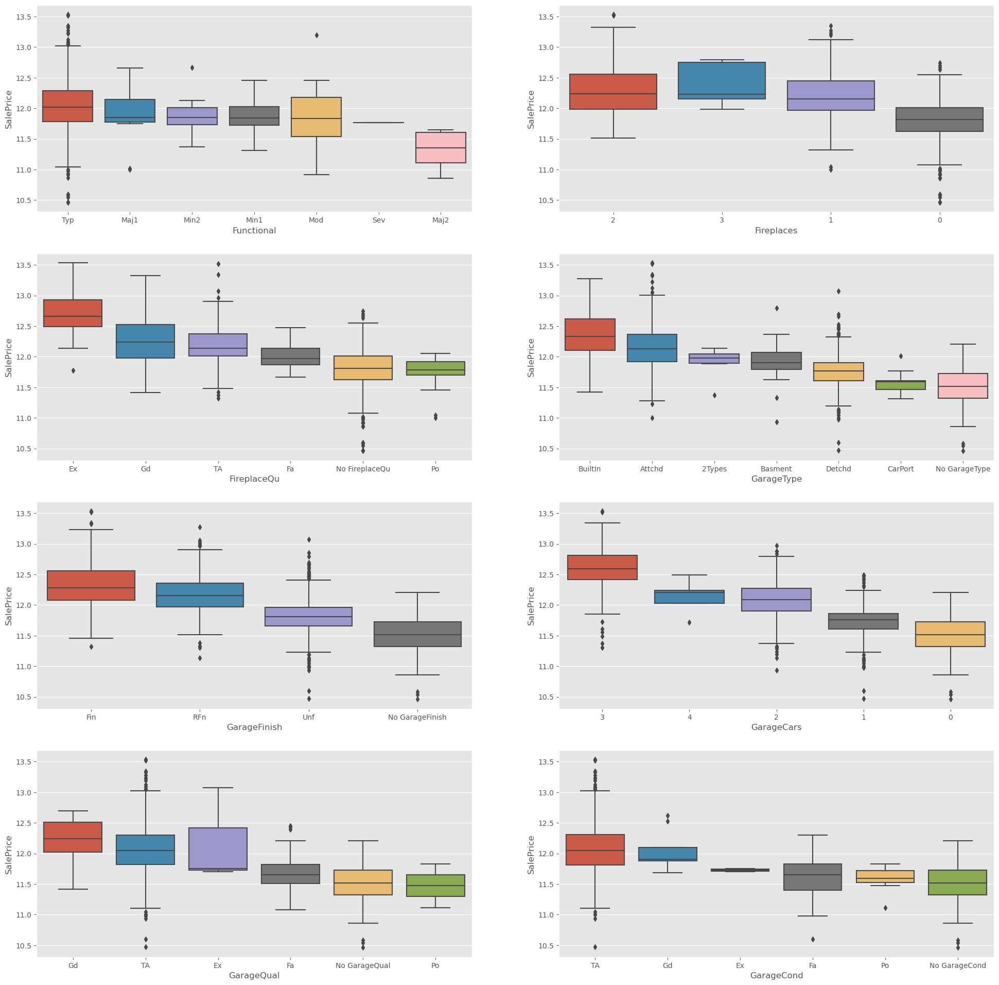

In [54]:
vars_cat_7 = ['Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageCars', 'GarageQual', 
            'GarageCond']
plot_categorical_boxplots(housing_data, vars_cat_7)

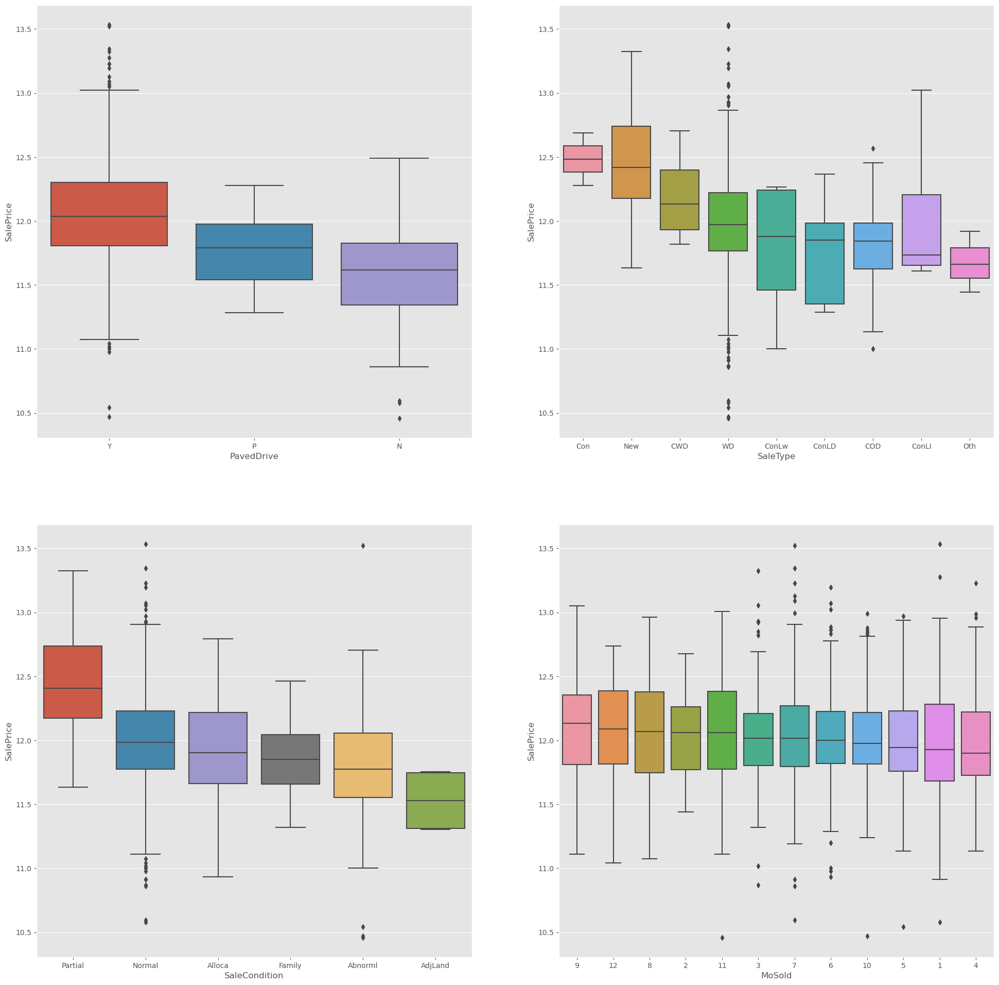

In [55]:
vars_cat_8 = ['PavedDrive',  'SaleType', 'SaleCondition', 'MoSold']
plot_categorical_boxplots(housing_data, vars_cat_8)

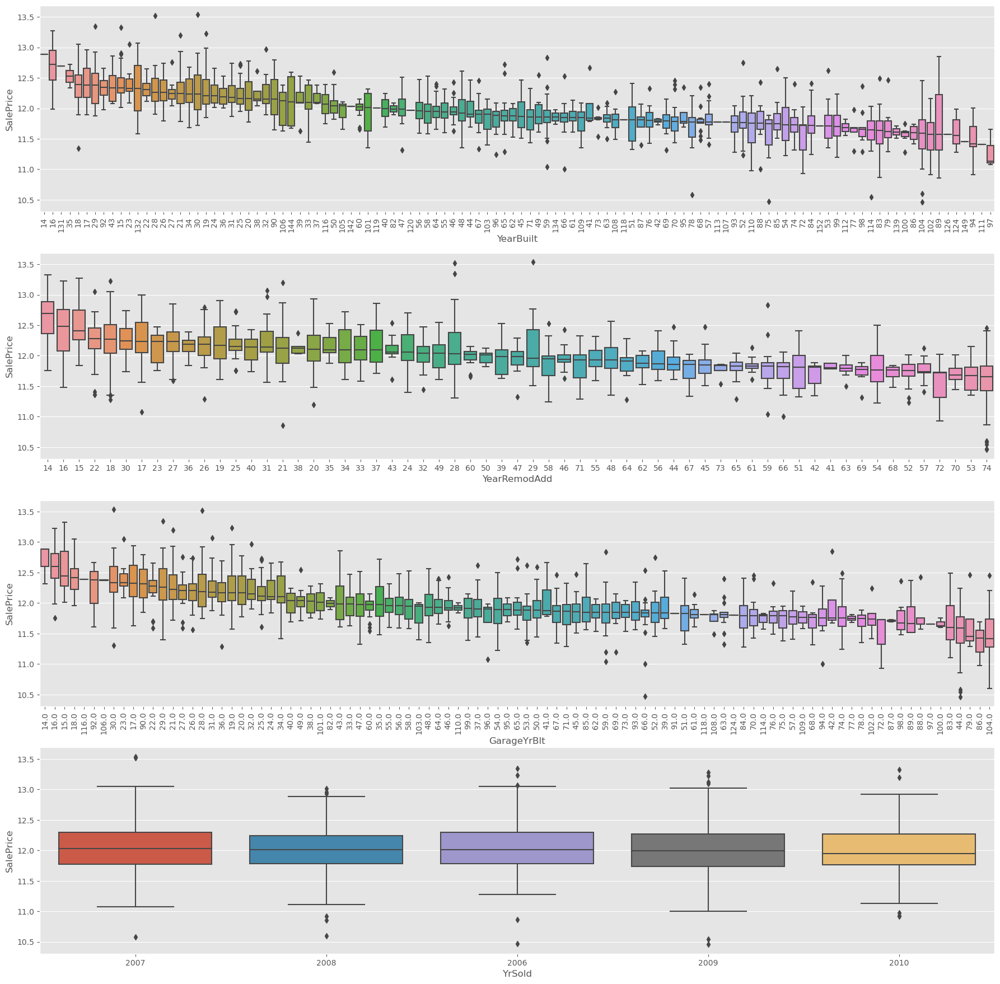

In [56]:
vars_cat_9 = [ 'YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']
plt.figure(figsize=(22, 22))
for i, cat_var in enumerate(vars_cat_9):
    my_order = housing_data[[cat_var, 'SalePrice']].groupby(by=cat_var).median().reset_index()
    my_order = my_order.sort_values(by='SalePrice', ascending=False)
    order_list = list(my_order[cat_var])
    plt.subplot(4, 1, i+1)
    sns.boxplot(data=housing_data, x=cat_var, y='SalePrice', order=order_list)
    if cat_var == 'GarageYrBlt' or cat_var == 'YearBuilt':
        plt.xticks(rotation=90,ha='center')
    else:
        plt.xticks(rotation=0)
            
plt.show()

 - Homes built post 1946 and newer which can either 2-storey or 1-storey have been sold at higher prices
 - Higher the density lower is the selling price
 - Irregularity in the house shape attracts higher price so does paved street
 - Hillside properties also seem to command higher prices. These could possibly be luxuriuos properties
 - The more the property is away from traffic the higher the price
 - finished houses quite intuitively command higher prices
 - overall quality rating seems to impacting the prices
 - The priciest neighborhoods are NorthRidge heights and NorthRidge
 - Basement quaility and exposure seems to impacting selling price
 - As expected heating and central air conditioning will command higher prices
 - vinyl sliding and metal sliding are the pre-dominant exteriors, but they seem to be cheaper in terms of price perception
 - Kitchen quality also seems to be a important factor
 - builtin or attached garages also seem to commend higher prices also the garage finish
 - newer homes either built or remodelled in the last 10-20 years seem to be more pricy
 - monthsold and yearsold does not seemt to show any price variation

<Figure size 1400x1400 with 0 Axes>

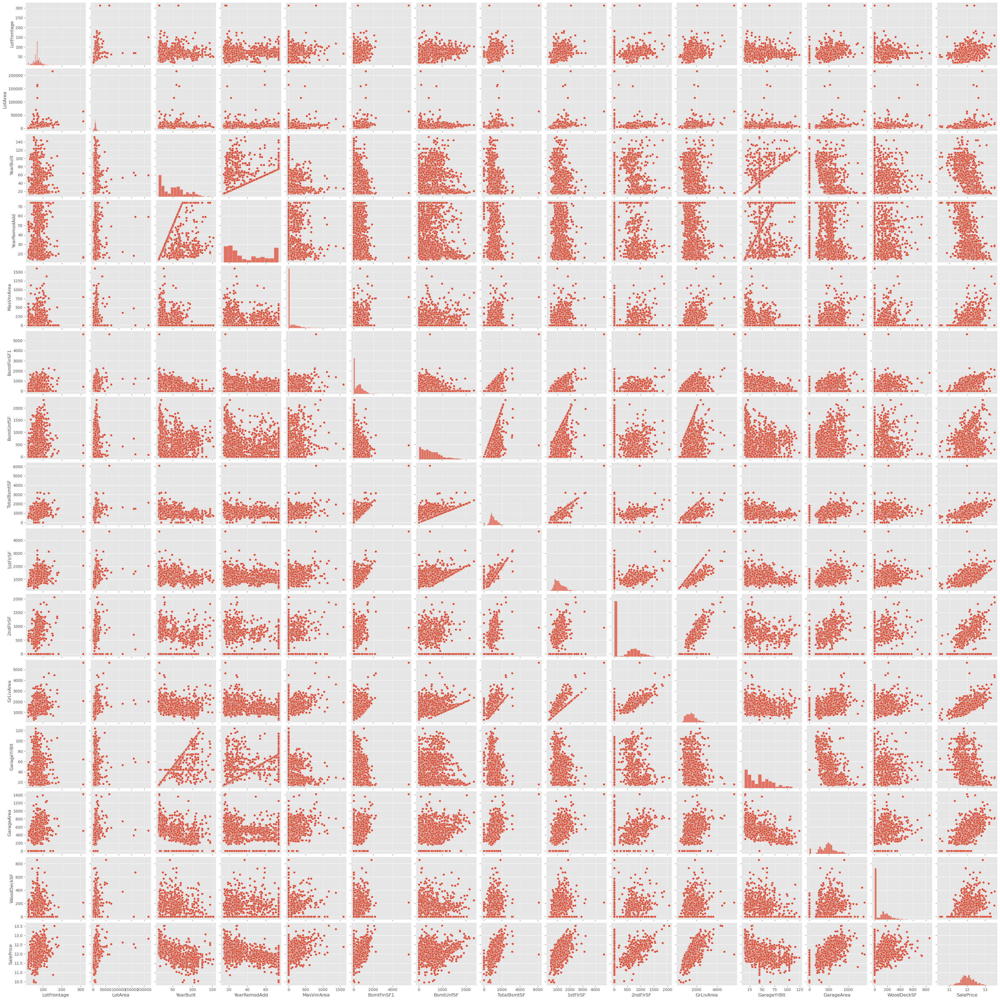

In [57]:
# checking the linear relationship with numeric data
plt.figure(figsize=[14,14])
sns.pairplot(data=housing_data, vars=['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 
                                      'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',  
                                      'GrLivArea', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'SalePrice'])
plt.show()

 - We can see that some variables like **GrLiveArea**, **Garage Area**, **BsmtSqf** etc. have a well defined linear relationship with SalePrice

## Part 3: Data Preparation
   
   - Exclusion of variables
   - Scaling and Encoding

### Excluding variables from analysis
After analyzing the data we can see that there are certain variables which have majority values as zero or belonging to one value which means that these features are not avaibale for majority of the houses. Hence we can drop these variables from the analysis. 

We will be dropping the variables which have
   - **0 values** for more than **80%** of the observations
   - **single value** for more than **95%** of the instances

Also dropping **ID** column as it does not add any value to the eventual analysis

In [58]:
housing_data = housing_data.drop(columns=['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'Id', 'BsmtFinSF2', 
                                          'LowQualFinSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'MiscVal', 
                                          'RoofMatl', 'PoolArea', 'Condition2'], axis = 1)

In [59]:
# Numeric columns List
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
numeric_columns = list(housing_data.select_dtypes(include=numerics).columns)
print(numeric_columns)

['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'SalePrice']


In [60]:
# Excluding target variable
numeric_columns.remove('SalePrice')

In [61]:
# Categorical columns list
categorical_columns = list(housing_data.select_dtypes(include='object').columns)
print(categorical_columns)

['MSSubClass', 'MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageCars', 'GarageQual', 'GarageCond', 'PavedDrive', 'MoSold', 'YrSold', 'SaleType', 'SaleCondition']


**Since the overall dimensionality in the data is high; we are using label encoding as that will create encoding in the dataset without increasing dimensionality and thereby the model complexity.**

In [62]:
# Label encoding the categorical variables
le = LabelEncoder()
housing_data[categorical_columns]=housing_data[categorical_columns].apply(le.fit_transform)
housing_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,5,3,65.0,8450,1,3,3,0,4,0,5,2,0,5,6,4,21,21,1,12,13,1,196.0,2,4,2,2,4,3,2,706,6,150,856,1,0,1,4,856,854,1710,1,0,2,1,3,1,2,6,6,0,3,1,21.0,2,2,548,5,5,2,0,61,1,2,8,4,12.247694
1,0,3,80.0,9600,1,3,3,0,2,0,24,1,0,2,5,7,48,48,1,8,8,2,0.0,3,4,1,2,4,1,0,978,6,284,1262,1,0,1,4,1262,0,1262,0,1,2,0,3,1,3,4,6,1,5,1,48.0,2,2,460,5,5,2,298,0,4,1,8,4,12.109011
2,5,3,68.0,11250,1,0,3,0,4,0,5,2,0,5,6,4,23,22,1,12,13,1,162.0,2,4,2,2,4,2,2,486,6,434,920,1,0,1,4,920,866,1786,1,0,2,1,3,1,2,4,6,1,5,1,23.0,2,2,608,5,5,2,0,42,8,2,8,4,12.317167
3,6,3,60.0,9550,1,0,3,0,0,0,6,2,0,5,6,4,109,54,1,13,15,2,0.0,3,4,0,4,1,3,0,216,6,540,756,1,2,1,4,961,756,1717,1,0,1,0,3,1,2,5,6,1,2,5,26.0,3,3,642,5,5,2,0,35,1,0,8,0,11.849398
4,5,3,84.0,14260,1,0,3,0,2,0,15,2,0,5,7,4,24,24,1,12,13,1,350.0,2,4,2,2,4,0,2,655,6,490,1145,1,0,1,4,1145,1053,2198,1,0,2,1,4,1,2,7,6,1,5,1,24.0,2,3,836,5,5,2,192,84,11,2,8,4,12.429216


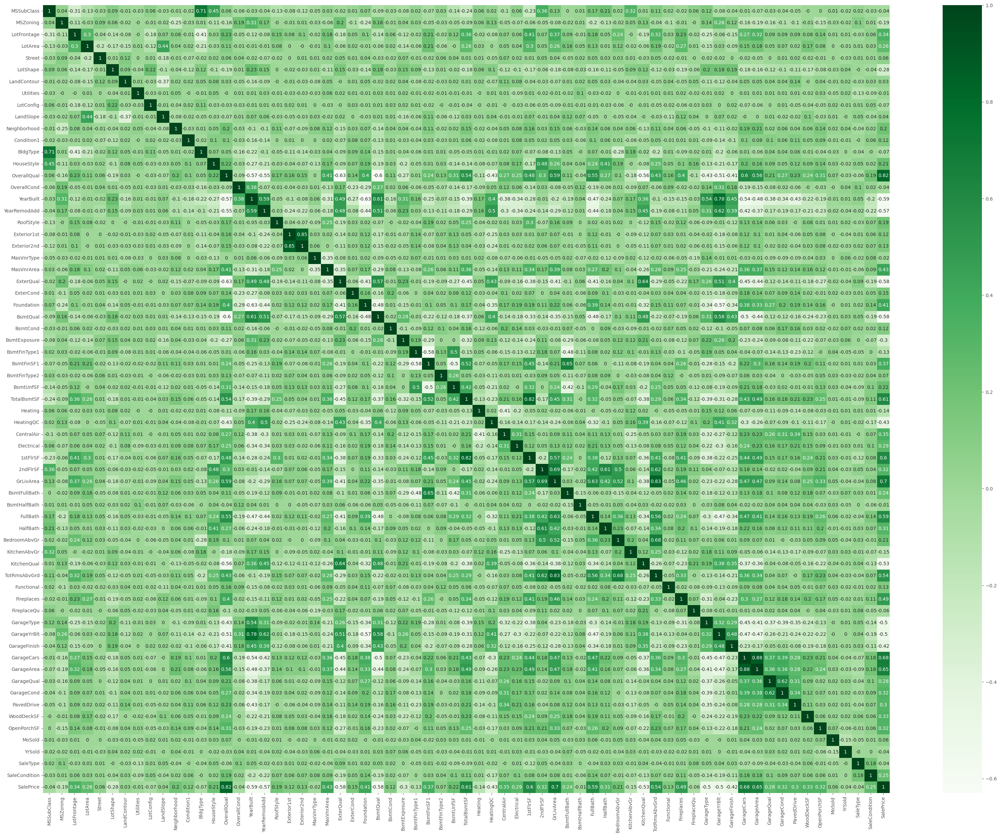

In [63]:
# Checking for correlation
plt.figure(figsize=(40,30))
sns.heatmap(round(housing_data.corr(),2), cmap = "Greens", annot=True)
plt.show()

#### Observations
 - High correlation observed between the following variables
     - GarageCars - GarageArea
     - GrLivArea - TotRmsAbvGrd
     - Exterior1st - Exterior2nd
     - YearBuilt - GarageYrBlt

In [64]:
# Scaling the numeric variable
scaler = StandardScaler()
housing_data[numeric_columns] = pd.DataFrame(scaler.fit_transform(housing_data[numeric_columns]))
housing_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,5,3,-0.220875,-0.207142,1,3,3,0,4,0,5,2,0,5,6,4,-1.050994,-0.878668,1,12,13,1,0.514104,2,4,2,2,4,3,2,0.575425,6,-0.944591,-0.459303,1,0,1,4,-0.793434,1.161852,0.370333,1,0,2,1,3,1,2,6,6,0,3,1,-1.017598,2,2,0.351000,5,5,2,-0.752176,0.216503,1,2,8,4,12.247694
1,0,3,0.460320,-0.091886,1,3,3,0,2,0,24,1,0,2,5,7,-0.156734,0.429577,1,8,8,2,-0.570750,3,4,1,2,4,1,0,1.171992,6,-0.641228,0.466465,1,0,1,4,0.257140,-0.795163,-0.482512,0,1,2,0,3,1,3,4,6,1,5,1,0.107927,2,2,-0.060731,5,5,2,1.626195,-0.704483,4,1,8,4,12.109011
2,5,3,-0.084636,0.073480,1,0,3,0,4,0,5,2,0,5,6,4,-0.984752,-0.830215,1,12,13,1,0.325915,2,4,2,2,4,2,2,0.092907,6,-0.301643,-0.313369,1,0,1,4,-0.627826,1.189351,0.515013,1,0,2,1,3,1,2,4,6,1,5,1,-0.934226,2,2,0.631726,5,5,2,-0.752176,-0.070361,8,2,8,4,12.317167
3,6,3,-0.447940,-0.096897,1,0,3,0,0,0,6,2,0,5,6,4,1.863632,0.720298,1,13,15,2,-0.570750,3,4,0,4,1,3,0,-0.499274,6,-0.061670,-0.687324,1,2,1,4,-0.521734,0.937276,0.383659,1,0,1,0,3,1,2,5,6,1,2,5,-0.809167,3,3,0.790804,5,5,2,-0.752176,-0.176048,1,0,8,0,11.849398
4,5,3,0.641972,0.375148,1,0,3,0,2,0,15,2,0,5,7,4,-0.951632,-0.733308,1,12,13,1,1.366489,2,4,2,2,4,0,2,0.463568,6,-0.174865,0.199680,1,0,1,4,-0.045611,1.617877,1.299326,1,0,2,1,4,1,2,7,6,1,5,1,-0.892540,2,3,1.698485,5,5,2,0.780197,0.563760,11,2,8,4,12.429216


In [65]:
# split into train and test
y = housing_data.pop('SalePrice')
X = housing_data


X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=100)

## Part 4: Model Building and Evaluation
   
   - Building Ridge and Lasso Regression Models
   - Understand the model accuracies for optimum alpa value
   - Identify the significant variables

## Ridge Regression

In [66]:
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

ridge = Ridge()

# cross validation
folds = 5
model_ridge_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_ridge_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [67]:
cv_results = pd.DataFrame(model_ridge_cv.cv_results_)
cv_results[['params', 'mean_train_score', 'mean_test_score']].head()

,params,mean_train_score,mean_test_score
0,{'alpha': 0.0001},-0.091431,-0.101610
1,{'alpha': 0.001},-0.091431,-0.101609
2,{'alpha': 0.01},-0.091432,-0.101606
3,{'alpha': 0.05},-0.091435,-0.101593
4,{'alpha': 0.1},-0.091438,-0.101578


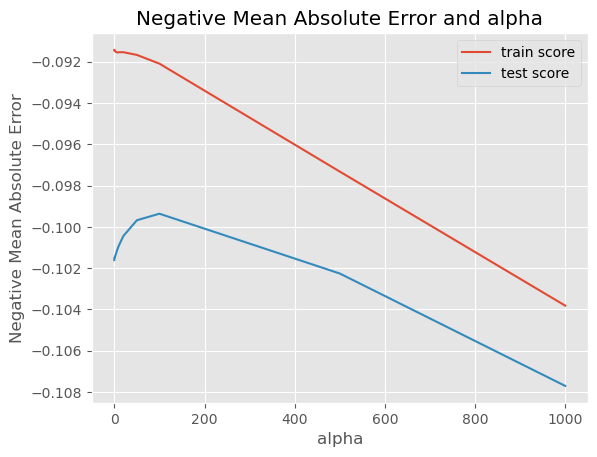

In [68]:
# plotting mean test and train scoes with alpha 
cv_results['param_alpha'] = cv_results['param_alpha'].astype('int32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper right')
plt.show()

In [69]:
print("\n The best estimator:\n",
          model_ridge_cv.best_estimator_)
print("\n The best score:\n",
          model_ridge_cv.best_score_)
print("\n The best parameters:\n",
          model_ridge_cv.best_params_)


 The best estimator:
 Ridge(alpha=100)

 The best score:
 -0.09936296176083409

 The best parameters:
 {'alpha': 100}


In [70]:
ridge = Ridge(alpha=model_ridge_cv.best_params_['alpha'])
ridge.fit(X_train, y_train)

y_pred_ridge_train=ridge.predict(X_train)
print('Train Accuracy (R Squared) : ', round(r2_score(y_train, y_pred_ridge_train),2))

y_pred_ridge_test=ridge.predict(X_test)
print('Test Accuracy (R Squared) : ', round(r2_score(y_test, y_pred_ridge_test),2))

Train Accuracy (R Squared) :  0.88
Test Accuracy (R Squared) :  0.87


In [71]:
# model coefficients
cols = X.columns
cols = cols.insert(0, "constant")
model_parameters = list(ridge.coef_)
ridge_list = list(zip(cols, model_parameters))

In [72]:
# creating the list of variables
final_pred_ridge = []
for i in range(len(ridge_list)):
    if(ridge_list[i][1]!=-0):
        final_pred_ridge.append(ridge_list[i])
print('Number of predictors selected by optimal alpha for ridge are:{0}'.format(len(final_pred_ridge)))

Number of predictors selected by optimal alpha for ridge are:66


In [73]:
final_pred_ridge = pd.DataFrame(final_pred_ridge)
final_pred_ridge.columns = ['Variables', 'Co-effecients']
final_pred_ridge = final_pred_ridge.sort_values(by='Co-effecients', ascending=False).reset_index()
final_pred_ridge = final_pred_ridge.drop(columns=['index'],axis=1)
final_pred_ridge.head(10)

,Variables,Co-effecients
0,HouseStyle,0.071581
1,2ndFlrSF,0.045276
2,GrLivArea,0.041044
3,Functional,0.037148
4,GarageFinish,0.033948
5,OverallQual,0.031432
6,Electrical,0.028445
7,1stFlrSF,0.025278
8,HeatingQC,0.024864
9,LotConfig,0.024793


#### Model Evaluation post doubling of best alpha - Ridge

In [74]:
double_alpha = model_ridge_cv.best_params_['alpha']*2
double_alpha

200

In [75]:
ridge = Ridge(alpha=double_alpha)
ridge.fit(X_train, y_train)

y_pred_ridge_train=ridge.predict(X_train)
print('Train Accuracy (R Squared) : ', round(r2_score(y_train, y_pred_ridge_train),2))

y_pred_ridge_test=ridge.predict(X_test)
print('Test Accuracy (R Squared) : ', round(r2_score(y_test, y_pred_ridge_test),2))

Train Accuracy (R Squared) :  0.87
Test Accuracy (R Squared) :  0.87


In [76]:
# model coefficients
cols = X.columns
cols = cols.insert(0, "constant")
model_parameters = list(ridge.coef_)
ridge_list_2 = list(zip(cols, model_parameters))

In [77]:
# creating the list of variables
final_pred_ridge_2 = []
for i in range(len(ridge_list_2)):
    if(ridge_list_2[i][1]!=-0):
        final_pred_ridge_2.append(ridge_list_2[i])
print('Number of predictors selected by optimal alpha for ridge are:{0}'.format(len(final_pred_ridge_2)))

Number of predictors selected by optimal alpha for ridge are:66


In [78]:
final_pred_ridge_2 = pd.DataFrame(final_pred_ridge_2)
final_pred_ridge_2.columns = ['Variables', 'Co-effecients']
final_pred_ridge_2 = final_pred_ridge_2.sort_values(by='Co-effecients', ascending=False).reset_index()
final_pred_ridge_2 = final_pred_ridge_2.drop(columns=['index'],axis=1)
final_pred_ridge_2.head(10)

,Variables,Co-effecients
0,HouseStyle,0.068141
1,2ndFlrSF,0.040977
2,Functional,0.033168
3,GrLivArea,0.029156
4,GarageFinish,0.028191
5,OverallQual,0.027844
6,Electrical,0.026000
7,1stFlrSF,0.024558
8,KitchenQual,0.021953
9,BsmtHalfBath,0.019674


#### Rebuilding model after dropping the top 5 variables

In [79]:
X = housing_data.drop(columns=['HouseStyle', '2ndFlrSF', 'Functional', 'GrLivArea', 'GarageFinish'])

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=100)

In [80]:
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

ridge = Ridge()

# cross validation
folds = 5
model_ridge_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_ridge_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [81]:
cv_results = pd.DataFrame(model_ridge_cv.cv_results_)
cv_results[['params', 'mean_train_score', 'mean_test_score']].head()

,params,mean_train_score,mean_test_score
0,{'alpha': 0.0001},-0.096382,-0.106661
1,{'alpha': 0.001},-0.096382,-0.106661
2,{'alpha': 0.01},-0.096384,-0.106658
3,{'alpha': 0.05},-0.096391,-0.106643
4,{'alpha': 0.1},-0.096400,-0.106626


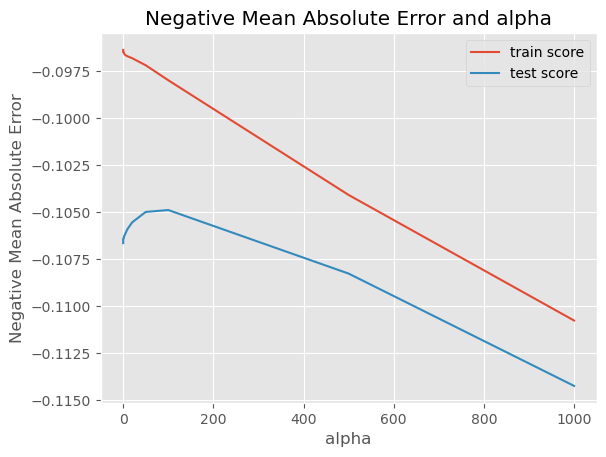

In [82]:
# plotting mean test and train scoes with alpha 
cv_results['param_alpha'] = cv_results['param_alpha'].astype('int32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper right')
plt.show()

In [83]:
print("\n The best estimator:\n",
          model_ridge_cv.best_estimator_)
print("\n The best score:\n",
          model_ridge_cv.best_score_)
print("\n The best parameters:\n",
          model_ridge_cv.best_params_)


 The best estimator:
 Ridge(alpha=100)

 The best score:
 -0.10489967654109696

 The best parameters:
 {'alpha': 100}


In [84]:
ridge = Ridge(alpha=model_ridge_cv.best_params_['alpha'])
ridge.fit(X_train, y_train)

y_pred_ridge_train=ridge.predict(X_train)
print('Train Accuracy (R Squared) : ', round(r2_score(y_train, y_pred_ridge_train),2))

y_pred_ridge_test=ridge.predict(X_test)
print('Test Accuracy (R Squared) : ', round(r2_score(y_test, y_pred_ridge_test),2))

Train Accuracy (R Squared) :  0.87
Test Accuracy (R Squared) :  0.86


In [85]:
# model coefficients
cols = X.columns
cols = cols.insert(0, "constant")
model_parameters = list(ridge.coef_)
ridge_list = list(zip(cols, model_parameters))

In [86]:
# creating the list of variables
final_pred_ridge = []
for i in range(len(ridge_list)):
    if(ridge_list[i][1]!=-0):
        final_pred_ridge.append(ridge_list[i])
print('Number of predictors selected by optimal alpha for ridge are:{0}'.format(len(final_pred_ridge)))

Number of predictors selected by optimal alpha for ridge are:61


In [87]:
final_pred_ridge = pd.DataFrame(final_pred_ridge)
final_pred_ridge.columns = ['Variables', 'Co-effecients']
final_pred_ridge = final_pred_ridge.sort_values(by='Co-effecients', ascending=False).reset_index()
final_pred_ridge = final_pred_ridge.drop(columns=['index'],axis=1)
final_pred_ridge.head(10)

,Variables,Co-effecients
0,BldgType,0.081076
1,TotRmsAbvGrd,0.042619
2,FullBath,0.039377
3,1stFlrSF,0.038744
4,BsmtHalfBath,0.038739
5,KitchenQual,0.035210
6,GarageYrBlt,0.033001
7,OverallQual,0.032287
8,Electrical,0.029880
9,LotConfig,0.025034


## Lasso Regression

In [88]:
X = housing_data


X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=100)

In [89]:
params = {'alpha': [0.0000001, 0.000001, 0.00001, 0.0001, 0.001, 0.01]}

lasso = Lasso()

# cross validation
model_lasso_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_lasso_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 6 candidates, totalling 30 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [1e-07, 1e-06, 1e-05, 0.0001, 0.001, 0.01]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [90]:
cv_results_lasso = pd.DataFrame(model_lasso_cv.cv_results_)
cv_results_lasso[['params', 'mean_train_score', 'mean_test_score']].head()

,params,mean_train_score,mean_test_score
0,{'alpha': 1e-07},-0.091431,-0.101609
1,{'alpha': 1e-06},-0.091431,-0.101606
2,{'alpha': 1e-05},-0.091429,-0.101577
3,{'alpha': 0.0001},-0.091437,-0.101402
4,{'alpha': 0.001},-0.091825,-0.100656


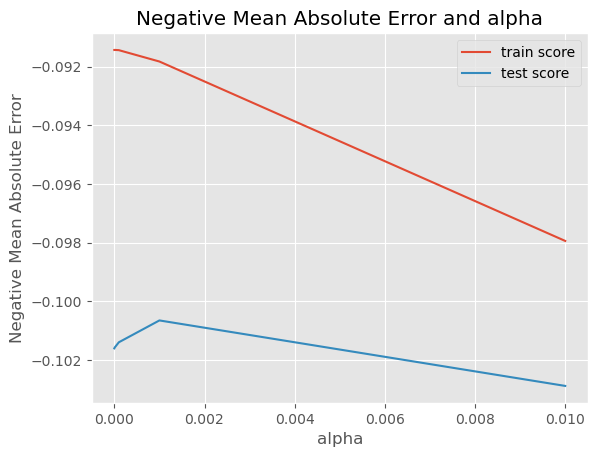

In [91]:
# plotting mean test and train scoes with alpha 
cv_results_lasso['param_alpha'] = cv_results_lasso['param_alpha'].astype('float32')

# plotting
plt.plot(cv_results_lasso['param_alpha'], cv_results_lasso['mean_train_score'])
plt.plot(cv_results_lasso['param_alpha'], cv_results_lasso['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')

plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper right')
plt.show()

In [92]:
print("\n The best estimator across ALL searched params:\n",
          model_lasso_cv.best_estimator_)
print("\n The best score across ALL searched params:\n",
          model_lasso_cv.best_score_)
print("\n The best parameters across ALL searched params:\n",
          model_lasso_cv.best_params_)


 The best estimator across ALL searched params:
 Lasso(alpha=0.001)

 The best score across ALL searched params:
 -0.10065637200887564

 The best parameters across ALL searched params:
 {'alpha': 0.001}


In [93]:
lasso = Lasso(alpha=model_lasso_cv.best_params_['alpha'])
lasso.fit(X_train, y_train)

y_pred_lasso_train=lasso.predict(X_train)
print('Train Accuracy (R Squared) : ', round(r2_score(y_train, y_pred_lasso_train),2))

y_pred_lasso_test=lasso.predict(X_test)
print('Test Accuracy (R Squared) : ', round(r2_score(y_test, y_pred_lasso_test),2))

Train Accuracy (R Squared) :  0.88
Test Accuracy (R Squared) :  0.87


In [94]:
# model coefficients
cols = X.columns
cols = cols.insert(0, "constant")
model_parameters = list(lasso.coef_)
lasso_list = list(zip(cols, model_parameters))

In [95]:
final_pred_lasso = []
for i in range(len(lasso_list)):
    if(lasso_list[i][1]!=0):
        final_pred_lasso.append(lasso_list[i])
print('Number of predictors selected by optimal alpha for lasso are:{0}'.format(len(final_pred_lasso)))

Number of predictors selected by optimal alpha for lasso are:57


In [96]:
final_pred_lasso = pd.DataFrame(final_pred_lasso)
final_pred_lasso.columns = ['Variables', 'Co-effecients']
final_pred_lasso = final_pred_lasso.sort_values(by='Co-effecients', ascending=False).reset_index()
final_pred_lasso = final_pred_lasso.drop(columns=['index'],axis=1)
final_pred_lasso.head(10)

,Variables,Co-effecients
0,2ndFlrSF,0.087412
1,HouseStyle,0.076577
2,GrLivArea,0.061578
3,GarageFinish,0.055820
4,LotConfig,0.052066
5,HeatingQC,0.051026
6,Functional,0.040870
7,OverallQual,0.036159
8,BsmtHalfBath,0.026739
9,LotShape,0.019738


#### Model evaluation post doubling of best alpha - Lasso

In [97]:
double_alpha_lasso = model_lasso_cv.best_params_['alpha']*2
double_alpha_lasso

0.002

In [98]:
lasso = Lasso(alpha=double_alpha_lasso)
lasso.fit(X_train, y_train)

y_pred_lasso_train=lasso.predict(X_train)
print('Train Accuracy (R Squared) : ', round(r2_score(y_train, y_pred_lasso_train),2))

y_pred_lasso_test=lasso.predict(X_test)
print('Test Accuracy (R Squared) : ', round(r2_score(y_test, y_pred_lasso_test),2))

Train Accuracy (R Squared) :  0.88
Test Accuracy (R Squared) :  0.87


In [99]:
# model coefficients
cols = X.columns
cols = cols.insert(0, "constant")
model_parameters = list(lasso.coef_)
lasso_list_2 = list(zip(cols, model_parameters))

In [100]:
final_pred_lasso_2 = []
for i in range(len(lasso_list_2)):
    if(lasso_list_2[i][1]!=0):
        final_pred_lasso_2.append(lasso_list_2[i])
print('Number of predictors selected by optimal alpha for lasso are:{0}'.format(len(final_pred_lasso_2)))

Number of predictors selected by optimal alpha for lasso are:52


In [101]:
final_pred_lasso_2 = pd.DataFrame(final_pred_lasso_2)
final_pred_lasso_2.columns = ['Variables', 'Co-effecients']
final_pred_lasso_2 = final_pred_lasso_2.sort_values(by='Co-effecients', ascending=False).reset_index()
final_pred_lasso_2 = final_pred_lasso_2.drop(columns=['index'],axis=1)
final_pred_lasso_2.head(10)

,Variables,Co-effecients
0,2ndFlrSF,0.091075
1,HouseStyle,0.078716
2,GarageFinish,0.055358
3,GrLivArea,0.052230
4,Functional,0.040457
5,OverallQual,0.034594
6,LotConfig,0.033812
7,HeatingQC,0.033602
8,BsmtHalfBath,0.016968
9,LotShape,0.015571


#### Rebuilding model after dropping the top 5 variables

In [102]:
X = housing_data.drop(columns = ['2ndFlrSF', 'HouseStyle', 'GarageFinish', 'GrLivArea', 'LotConfig'], axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=100)

In [103]:
params = {'alpha': [0.0000001, 0.000001, 0.00001, 0.0001, 0.001, 0.01]}

lasso = Lasso()

# cross validation
model_lasso_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_lasso_cv.fit(X_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [1e-07, 1e-06, 1e-05, 0.0001, 0.001, 0.01]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [104]:
cv_results_lasso = pd.DataFrame(model_lasso_cv.cv_results_)
cv_results_lasso[['params', 'mean_train_score', 'mean_test_score']].head()

,params,mean_train_score,mean_test_score
0,{'alpha': 1e-07},-0.095792,-0.106226
1,{'alpha': 1e-06},-0.095792,-0.106225
2,{'alpha': 1e-05},-0.095798,-0.106209
3,{'alpha': 0.0001},-0.095861,-0.106064
4,{'alpha': 0.001},-0.096674,-0.105264


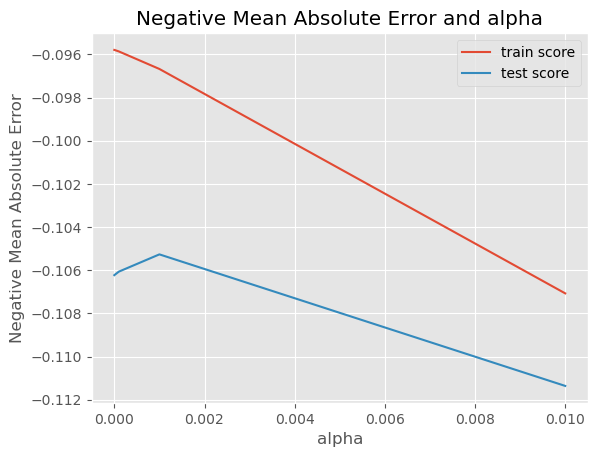

In [105]:
# plotting mean test and train scoes with alpha 
cv_results_lasso['param_alpha'] = cv_results_lasso['param_alpha'].astype('float32')

# plotting
plt.plot(cv_results_lasso['param_alpha'], cv_results_lasso['mean_train_score'])
plt.plot(cv_results_lasso['param_alpha'], cv_results_lasso['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')

plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper right')
plt.show()

In [106]:
print("\n The best estimator across ALL searched params:\n",
          model_lasso_cv.best_estimator_)
print("\n The best score across ALL searched params:\n",
          model_lasso_cv.best_score_)
print("\n The best parameters across ALL searched params:\n",
          model_lasso_cv.best_params_)


 The best estimator across ALL searched params:
 Lasso(alpha=0.001)

 The best score across ALL searched params:
 -0.10526361594186658

 The best parameters across ALL searched params:
 {'alpha': 0.001}


In [107]:
lasso = Lasso(alpha=model_lasso_cv.best_params_['alpha'])
lasso.fit(X_train, y_train)

y_pred_lasso_train=lasso.predict(X_train)
print('Train Accuracy (R Squared) : ', round(r2_score(y_train, y_pred_lasso_train),2))

y_pred_lasso_test=lasso.predict(X_test)
print('Test Accuracy (R Squared) : ', round(r2_score(y_test, y_pred_lasso_test),2))

Train Accuracy (R Squared) :  0.87
Test Accuracy (R Squared) :  0.87


In [108]:
# model coefficients
cols = X.columns
cols = cols.insert(0, "constant")
model_parameters = list(lasso.coef_)
lasso_list = list(zip(cols, model_parameters))

In [109]:
final_pred_lasso = []
for i in range(len(lasso_list)):
    if(lasso_list[i][1]!=0):
        final_pred_lasso.append(lasso_list[i])
print('Number of predictors selected by optimal alpha for lasso are:{0}'.format(len(final_pred_lasso)))

Number of predictors selected by optimal alpha for lasso are:52


In [110]:
final_pred_lasso = pd.DataFrame(final_pred_lasso)
final_pred_lasso.columns = ['Variables', 'Co-effecients']
final_pred_lasso = final_pred_lasso.sort_values(by='Co-effecients', ascending=False).reset_index()
final_pred_lasso = final_pred_lasso.drop(columns=['index'],axis=1)
final_pred_lasso.head(10)

,Variables,Co-effecients
0,BldgType,0.084752
1,BsmtHalfBath,0.061755
2,1stFlrSF,0.058428
3,FullBath,0.056059
4,Utilities,0.053207
5,HeatingQC,0.051141
6,GarageYrBlt,0.049714
7,Functional,0.045344
8,Electrical,0.039225
9,OverallQual,0.034552


### Final Observations:

#### Model Summary:
- **Ridge Regression:**
     - Alpha Value = 100
     - Train Accuracy - 88%
     - Test Accuracy - 87%
     - Top 5 Features:
         - HouseStyle
         - 2ndFlrSF
         - GrLivArea
         - Functional
         - Garage Finish

- **Lasso Reggresion:**
     - Alpha Value = 0.001
     - Train Accuracy - 88%
     - Test Accuracy - 87%
     - Top 5 Features:
         - 2ndFlrSF
         - HouseStyle
         - GrLivArea
         - Garage Finish
         - LotConfig

Overall accuracy for both the regularization models is pretty same however since we get same level of accuracy with fewer variables in Lasso the model complexity is somewhat reduced hence we can go with Lasso Regression.
Also since the train and test accuracies are so close the model needs more further fine tuning.

Based on the current model the top 10 primary factors that drive price are:
   - Overall area of the house (GrLivArea and square footage of the 2nd floor) 
   - Style of the house
   - Heating Quality
   - Overall Quality Rating
   - Lot Shape
   - Functionality
   
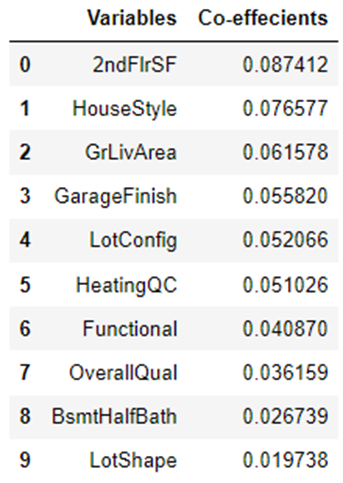